## A. Predictive Modeling Discussion. 

#### Do not state the specific models you will use, but you MUST state:

### a. Are you working on a REGRESSION or CLASSIFICATION problem?

I am working on a classification problem.

### b. Which variables are inputs? 

Categorical inputs: `playlist_genre`

Numeric categorical inputs: `key`, `mode`

Numeric continuous inputs: `danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`, and `duration_ms`

### c. Which variables are responses/outputs/outcomes/targets? 

`track_popularity_binary` is the output variable.

### d. Did you need to DERIVE the responses of interest by SUMMARIZING the available data?  

Yes

### e. If so, what summary actions did you perform? 

I summarized the playlist data using the mode function, so that for a given track, there is only one playlist.

### f. Which variables are identifiers and should NOT be used in the models? 

The ID variables are: `track_id`, `track_name`, `track_artist`, `track_album_id`, `track_album_name`, and `playlist_id`. 

### g. Important: Answer this question after completing parts C and D. Return to this predictive modeling discussion section to answer the following:  
#### i. Which of the inputs do you think influence the response, based on your exploratory visualizations? Which exploratory visualization helped you identify potential input-to-output relationships? (If you are not sure which inputs seem to influence the response, it is okay to say so.)

Based on the point plots, `danceability`, `energy`, `loudness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, and `duration` showed differences in their means across `track_popularity_binary`, with non-overlapping confidence intervals. This indicates there could be some relationship with the output. 

However, the boxplots for these continuous variables showed that the interquartile ranges were largely overlapping, indicating that the middle 50% of the data is similar across the two output classes.

For the heatmaps of the categorical inputs, `mode` and `key` had similar proportions, indicating they are unlikely to strongly influence popularity. `playlist_genre` showed more variation, as well as `track_album_decade`.

## B. Exploratory Data Analysis. 

Complete these general requirements:  

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

### a. You must read in the data associated with your project.  

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

In [3]:
df = pd.read_csv(songs_url)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

### b. You must perform the ESSENTIAL Exploration activities: 
#### i. Display the number of rows and columns. 

In [5]:
df.shape

(32833, 23)

#### ii. Display the column names and their associated data types.  

In [6]:
df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

#### iii. Display the number of missing values for each column.  

In [7]:
df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

Since there are only 5 rows of missing values, I will drop them.

In [8]:
df_clean = df.dropna().reset_index(drop=True).copy()

In [9]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32828 entries, 0 to 32827
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32828 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32828 non-null  int64  
 4   track_album_id            32828 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32828 non-null  object 
 7   playlist_name             32828 non-null  object 
 8   playlist_id               32828 non-null  object 
 9   playlist_genre            32828 non-null  object 
 10  playlist_subgenre         32828 non-null  object 
 11  danceability              32828 non-null  float64
 12  energy                    32828 non-null  float64
 13  key                       32828 non-null  int64  
 14  loudne

In [10]:
df_clean.isna().sum()

track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

#### iv. Display the number of unique values for each column. 

In [11]:
df_clean.nunique()

track_id                    28352
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22543
track_album_name            19743
track_album_release_date     4529
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17682
duration_ms                 19782
dtype: int64

Before proceeding with part B.c., I performed some data cleaning to ensure each track was uniquely represented by grouping on track_id. I also standardized the release date by converting it from a string format into a categorical year and decade variable.

According to the Tidy Tuesday data dictionary, `track_id` is supposed to uniquely identify each song. We can verify this by using `.nunique()` on the track_id column. As the output below shows, there are fewer unique track IDs than rows in the dataset, indicating that some songs appear multiple times.

In [12]:
df_clean.track_id.nunique()

28352

The .value_counts() method is used twice in the cell below. The first call counts how many rows exist for each unique track_id. The second call then counts how many songs appear 1 time, 2 times, 3 times, and so on.

In [13]:
df_clean.track_id.value_counts().value_counts()

count
1     25187
2      2383
3       510
4       142
5        60
6        35
7        17
8        15
9         2
10        1
Name: count, dtype: int64

I will check a few of the songs that appear 10 times in the data set.

In [14]:
df_clean.track_id.value_counts()[df_clean.track_id.value_counts() == 10][:10]

track_id
7BKLCZ1jbUBVqRi2FVlTVw    10
Name: count, dtype: int64

All rows with this `track_id` have identical values for every column except those related to the playlist.

In [15]:
df_clean.loc[ df_clean.track_id.isin(df_clean.track_id.value_counts()[df_clean.track_id.value_counts() == 10].index.to_list()), :]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
133,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
1731,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Post pop teen,222nc9tKxKhfZ2GBrOpwH3,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
2478,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Electropop Hits 2017-2020,7kyvBmlc1uSqsTL0EuNLrx,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
4535,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,A Loose Definition of Indie Poptimism,4ZO0wp9G8FA3X6oYNBzda6,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
7369,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,◤ Hip Hop Dance Music – Urban – Trap – Breakin...,0Hr2h94pKN8QAGVAgD6BsD,rap,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
17464,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Tropical House Run 190 BPM,37i9dQZF1DWSTc9FdySHtz,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
18355,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
19766,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
23779,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,r&b,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
30624,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2015 songs,6UJw1egIcZVfrBmcKs5uHH,edm,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960


Because the same `track_id` appears in multiple playlists, I will examine how many unique playlist_id values are associated with it.

In [16]:
df.playlist_id.nunique()

471

In [17]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32828 entries, 0 to 32827
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32828 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32828 non-null  int64  
 4   track_album_id            32828 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32828 non-null  object 
 7   playlist_name             32828 non-null  object 
 8   playlist_id               32828 non-null  object 
 9   playlist_genre            32828 non-null  object 
 10  playlist_subgenre         32828 non-null  object 
 11  danceability              32828 non-null  float64
 12  energy                    32828 non-null  float64
 13  key                       32828 non-null  int64  
 14  loudne

In [18]:
df_clean.groupby(['track_id', 'playlist_name', 'playlist_genre']).\
aggregate(num_track_pop_values = ('track_popularity', 'nunique'),
          num_valence_values = ('valence', 'nunique'),
          num_playlist_names = ('playlist_name', 'nunique'),
          num_playlist_id = ('playlist_id', 'nunique'),
          num_playlist_genre = ('playlist_genre', 'nunique')).\
reset_index().\
nunique()

track_id                28352
playlist_name             449
playlist_genre              6
num_track_pop_values        1
num_valence_values          1
num_playlist_names          1
num_playlist_id             1
num_playlist_genre          1
dtype: int64

In [19]:
unique_check = df_clean.groupby('track_id').nunique()
(unique_check == 1).all()

track_name                   True
track_artist                 True
track_popularity             True
track_album_id               True
track_album_name             True
track_album_release_date     True
playlist_name               False
playlist_id                 False
playlist_genre              False
playlist_subgenre           False
danceability                 True
energy                       True
key                          True
loudness                     True
mode                         True
speechiness                  True
acousticness                 True
instrumentalness             True
liveness                     True
valence                      True
tempo                        True
duration_ms                  True
dtype: bool

To remove duplicate tracks, I grouped by track_id, retaining the first occurrence of track-specific variables and the most common value for playlist-related fields (Stack Overflow reference included at the end of this document).

In [20]:
unique_cols = [
    'track_name', 'track_artist', 'track_popularity', 
    'track_album_id', 'track_album_name', 'track_album_release_date',
    'danceability', 'energy', 'key', 'loudness', 'mode',
    'speechiness', 'acousticness', 'instrumentalness', 
    'liveness', 'valence', 'tempo', 'duration_ms'
]
non_unique_cols = ['playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre']

agg_dict = {col: (lambda x: x.mode().iloc[0]) for col in non_unique_cols}
agg_dict.update({col: 'first' for col in unique_cols})

df_clean = df_clean.groupby('track_id').agg(agg_dict).reset_index()
df_clean

,track_id,playlist_name,playlist_id,playlist_genre,playlist_subgenre,track_name,track_artist,track_popularity,track_album_id,track_album_name,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0017A6SJgTbfQVU2EtsPNo,Pinoy Classic Rock,37i9dQZF1DWYDQ8wBxd7xt,rock,classic rock,Pangarap,Barbie's Cradle,41,1srJQ0njEQgd8w4XSqI4JQ,Trip,...,2,-10.068,1,0.0236,0.279000,0.011700,0.0887,0.566,97.091,235440
1,002xjHwzEx66OWFV2IP9dk,Groovy // Funky // Neo-Soul,0JmBB9HfrzDiZoPVRdv8ns,r&b,neo soul,The Others,RIKA,15,1ficfUnZMaY1QkNp15Slzm,The Others,...,5,-6.242,1,0.0347,0.065100,0.000000,0.2120,0.698,150.863,197286
2,004s3t0ONYlzxII9PLgU6z,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,rock,hard rock,I Feel Alive,Steady Rollin,28,3z04Lb9Dsilqw68SHt6jLB,Love & Loss,...,9,-4.739,1,0.0442,0.011700,0.009940,0.3470,0.404,135.225,373512
3,008MceT31RotUANsKuzy3L,Electropop - Pop,5TiiHps0hNCyQ6ijVkNZQs,pop,electropop,Liquid Blue,The.madpix.project,24,1Z4ANBVuhTlS6DprlP0m1q,Liquid Blue,...,10,-5.644,0,0.0540,0.000761,0.132000,0.3220,0.852,128.041,228565
4,008rk8F6ZxspZT4bUlkIQG,Best of 2019 Dance Pop: Japan,37i9dQZF1DXdOtZGKonFlM,pop,dance pop,Fever,YOSA & TAAR,38,2BuYm9UcKvI0ydXs5JKwt0,Fever,...,1,-6.300,1,0.0499,0.114000,0.000697,0.0881,0.496,129.884,236308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28347,7zxRMhXxJMQCeDDg0rKAVo,PROJECT: Contemporary,6HaCi9bqaiuSZEDfCEmwyo,r&b,urban contemporary,Some Way,NAV,72,4JR29CNW14Zc4Z5vflxkoJ,NAV,...,0,-6.103,1,0.3510,0.101000,0.000000,0.0919,0.340,154.962,179773
28348,7zyLObYw4QUKQDyZOb4J0Y,New Jack Swing/ R&B Hits: 1987 - 2002,4sji14lrB5bgcr51lPALYH,r&b,new jack swing,I'll Do 4 U (Re-Recorded / Remastered),Father MC,36,14HYMxFhpgDIr9cci1u0kt,I'll Do 4 U (Re-Recorded / Remastered),...,1,-4.920,0,0.0633,0.143000,0.000000,0.0720,0.810,109.536,223890
28349,7zycSpvjDcqh6YT1FEl2kY,10er Playlist,1kEczIkZH8IgaWT2BiApxZ,pop,electropop,Anaconda,Nicki Minaj,49,5qs8T6ZHSrnllnOuUk6muC,The Pinkprint (Deluxe Edition),...,2,-6.224,1,0.1800,0.067300,0.000006,0.2140,0.647,129.990,260240
28350,7zye9v6B785eFWEFYs13C2,Sexy Soul 2020,5EMARioe9z9eKOeWIAC2JW,r&b,neo soul,Bound,Ponderosa Twins Plus One,40,1xdgLmTFMSyJyI5DJOOX7T,2+2+1 = (Digitally Remastered),...,5,-6.457,0,0.0270,0.715000,0.000428,0.1150,0.657,142.218,191205


In [21]:
df_clean.shape

(28352, 23)

I converted `track_album_release_date` into a standardized date format and extracted the album’s release year and decade as categorical variables for easier analysis. (Stack Overflow reference included at the end of this document).

In [22]:
def normalize(x):
    x_str = str(x).strip()
    if x_str == "" or pd.isna(x):
        return None  # keep missing as None
    parts = x_str.split('-')
    if len(parts) == 1:  # year only
        return x_str + "-01-01"
    elif len(parts) == 2:  # year-month only
        return x_str + "-01"
    else:  # full date
        return x_str
        
df_clean['track_album_release_date_normalized'] = df_clean['track_album_release_date'].apply(normalize)
df_clean['track_album_release_date_dt'] = pd.to_datetime(
    df_clean['track_album_release_date_normalized'],
    errors='coerce'
)
df_clean['track_album_year'] = df_clean['track_album_release_date_dt'].dt.year.astype('Int64')
df_clean['track_album_decade'] = (df_clean['track_album_year'] // 10 * 10).astype('Int64')
df_clean['track_album_year'] = df_clean['track_album_year'].astype('category')
df_clean['track_album_decade'] = df_clean['track_album_decade'].astype('category')



In [23]:
df_clean[['track_album_release_date', 'track_album_decade']].head(53)

,track_album_release_date,track_album_decade
0,2001-01-01,2000
1,2018-01-26,2010
2,2017-11-21,2010
3,2015-08-07,2010
4,2018-11-16,2010
5,2018-06-01,2010
6,1997-01-01,1990
7,1999-08-24,1990
8,1989-07-07,1980
9,2019-06-21,2010


In [24]:
df_clean[['track_album_release_date_dt', 'track_album_year', 'track_album_decade']].isna().sum()

track_album_release_date_dt    0
track_album_year               0
track_album_decade             0
dtype: int64

### c. You must state whether you want to effectively treat a numeric column as a non-numeric for exploration purposes. 

I will treat `mode` and `key` as non-numeric variables because they have relatively few unique values.

In [25]:
df_clean.loc[:, ['key', 'mode']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   key     28352 non-null  int64
 1   mode    28352 non-null  int64
dtypes: int64(2)
memory usage: 443.1 KB


In [26]:
df.loc[:, ['key', 'mode']].nunique()

key     12
mode     2
dtype: int64

### d. You do NOT need to display the COUNTS for categorical variables because you will visually display the variables. However, you may display/print COUNTS if it helps you. 

In [27]:
df_clean.playlist_genre.value_counts()

playlist_genre
edm      5378
rap      5066
r&b      4635
pop      4544
latin    4427
rock     4302
Name: count, dtype: int64

In [28]:
df_clean['mode'].value_counts()

mode
1    16034
0    12318
Name: count, dtype: int64

In [29]:
df_clean.key.value_counts()

key
1     3436
0     3001
7     2907
9     2631
11    2577
2     2478
5     2301
6     2261
8     2066
10    1972
4     1925
3      797
Name: count, dtype: int64

### e. You must visualize the MARGINAL distributions for ALL variables in your data.  

#### i. Continuous variables: Histograms or density plots. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


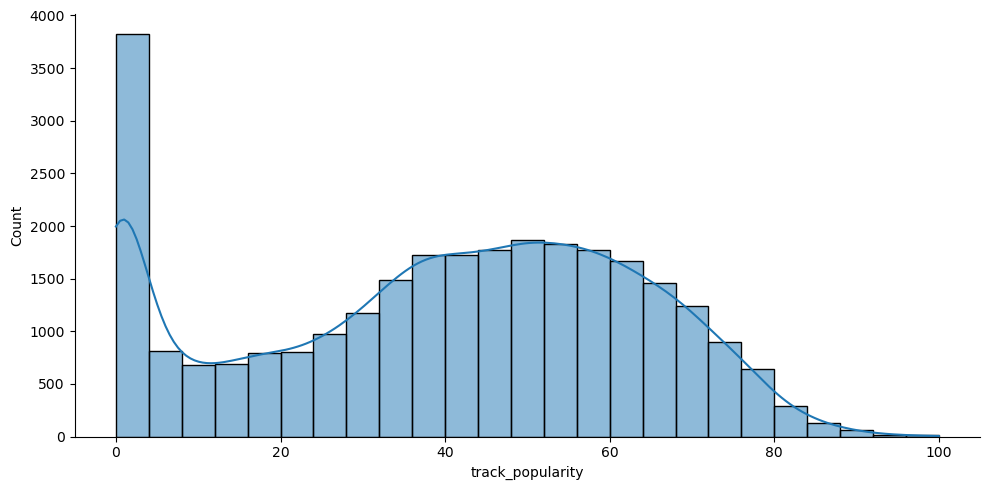

In [30]:
sns.displot(data=df_clean, x='track_popularity', bins=25, kde=True, aspect=2)

plt.show()

As noted in the feedback file, `track_popularity` is a bounded variable. To address this, I convert it into a categorical variable, using track_popularity > 50 for this EDA. Later, I may explore a more imbalanced classification.

In [31]:
df_clean['track_popularity_binary'] = np.where( df_clean.track_popularity > 50, 1, 0 )

In [32]:
df_clean.track_popularity_binary.value_counts(normalize=True)

track_popularity_binary
0    0.629444
1    0.370556
Name: proportion, dtype: float64

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


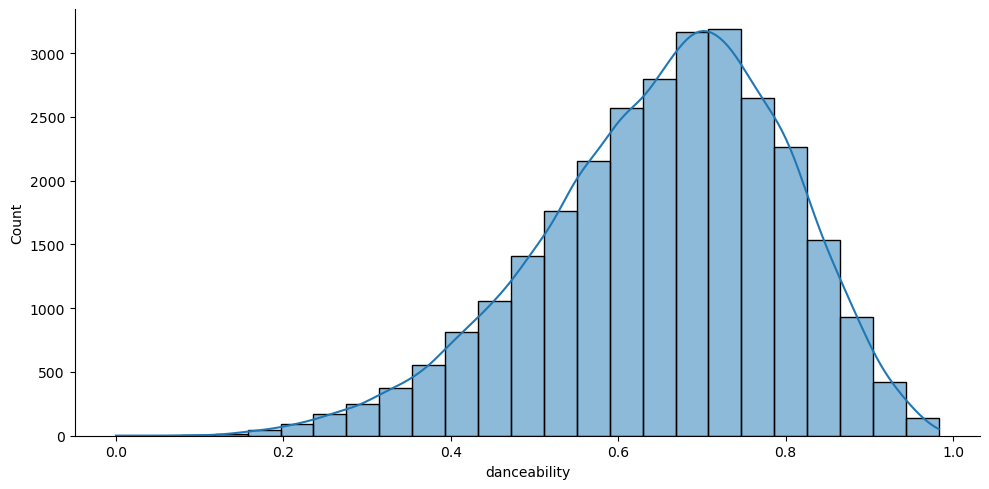

In [33]:
sns.displot(data=df_clean, x='danceability', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


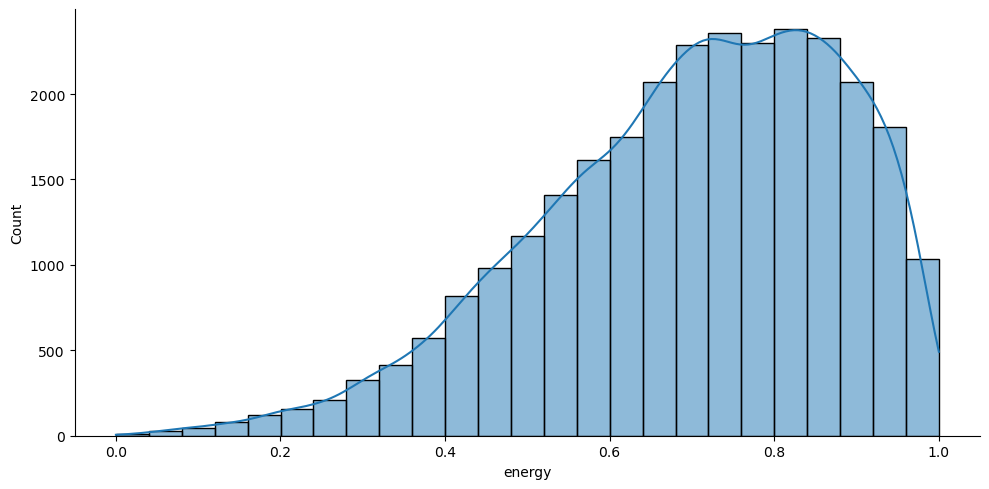

In [34]:
sns.displot(data=df_clean, x='energy', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


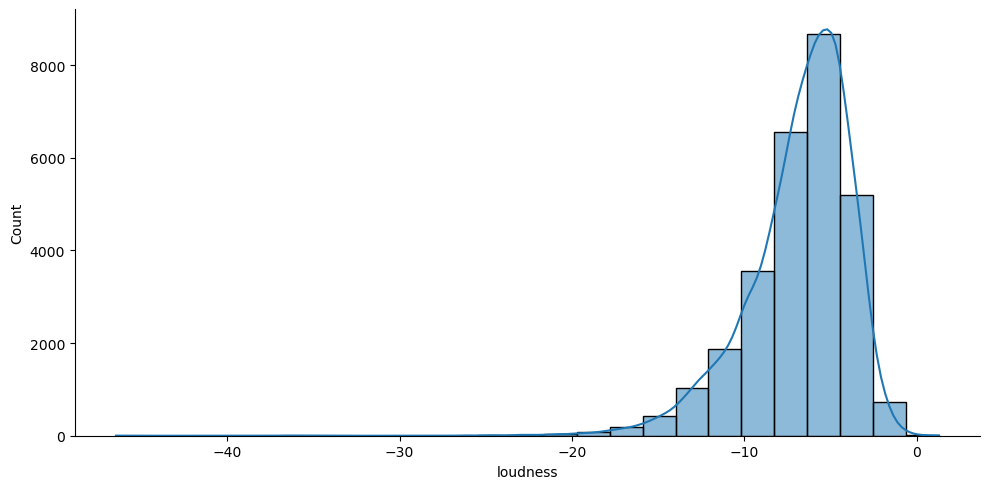

In [35]:
sns.displot(data=df_clean, x='loudness', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


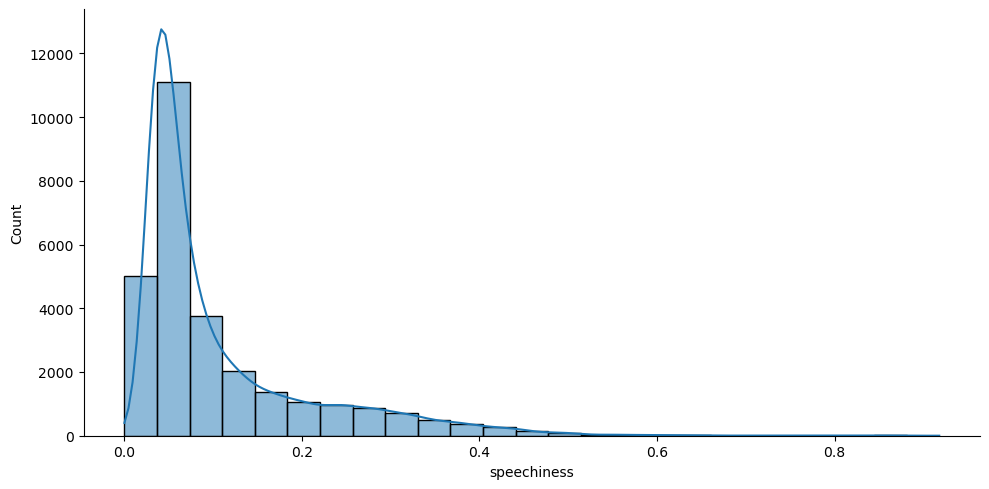

In [36]:
sns.displot(data=df_clean, x='speechiness', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


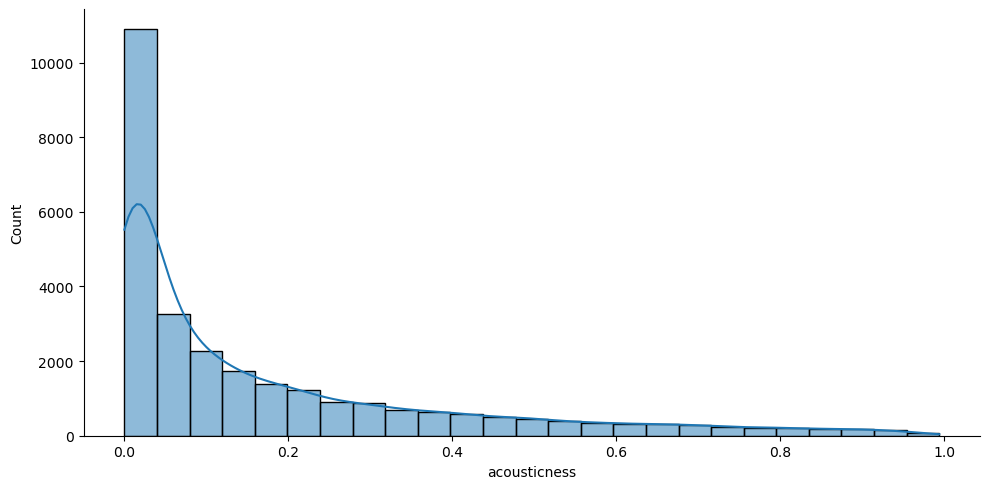

In [37]:
sns.displot(data=df_clean, x='acousticness', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


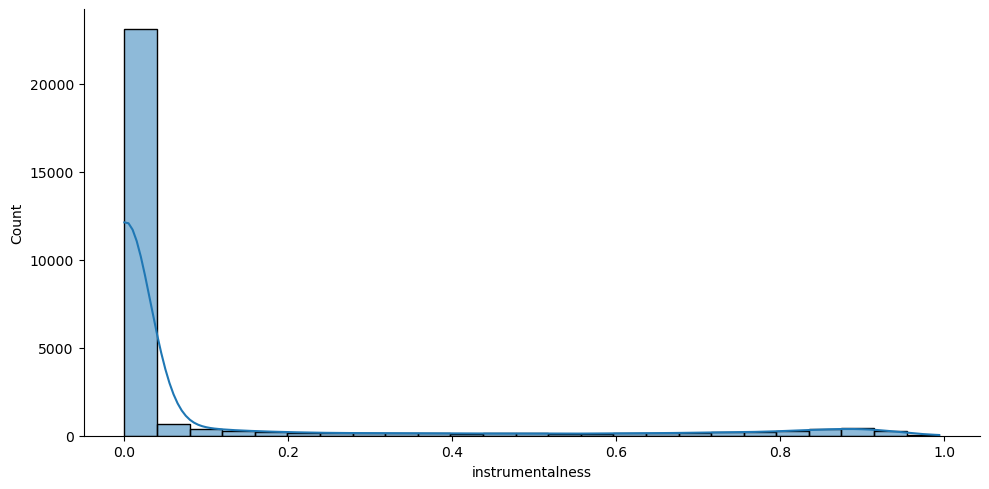

In [38]:
sns.displot(data=df_clean, x='instrumentalness', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


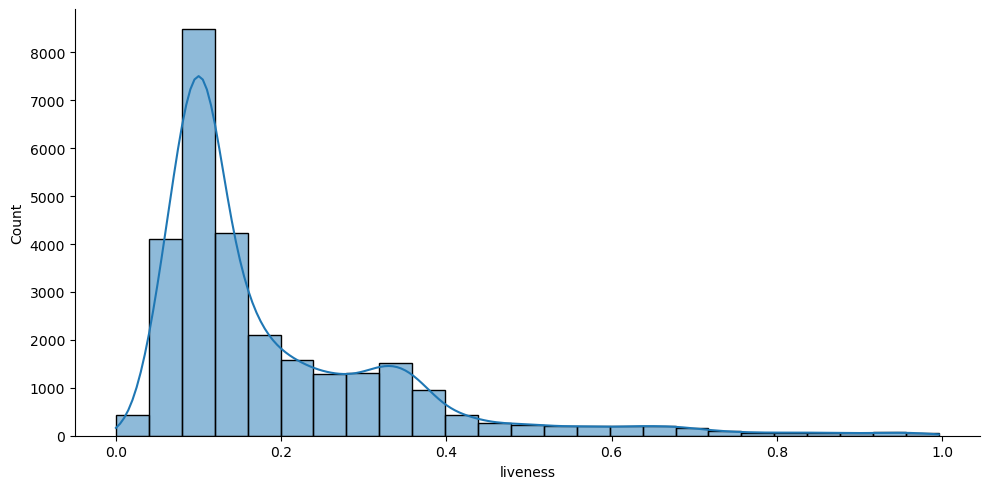

In [39]:
sns.displot(data=df_clean, x='liveness', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


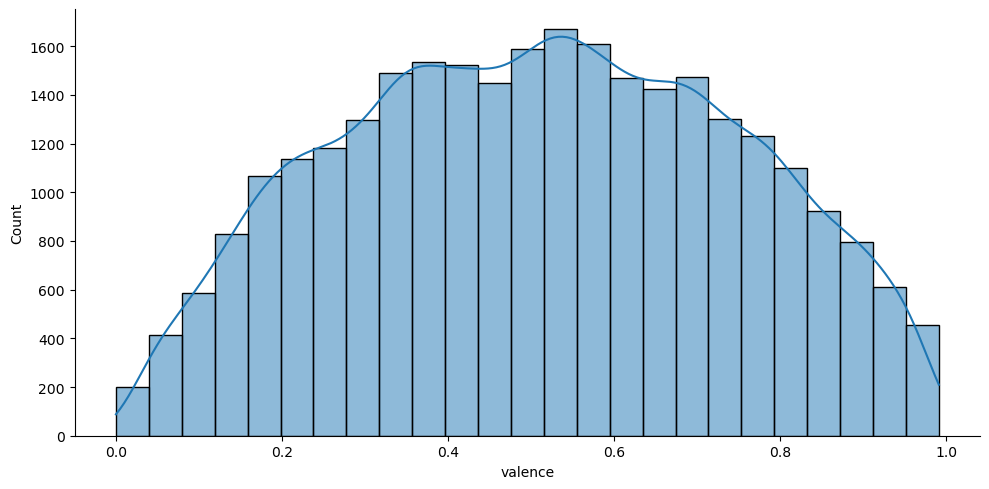

In [40]:
sns.displot(data=df_clean, x='valence', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


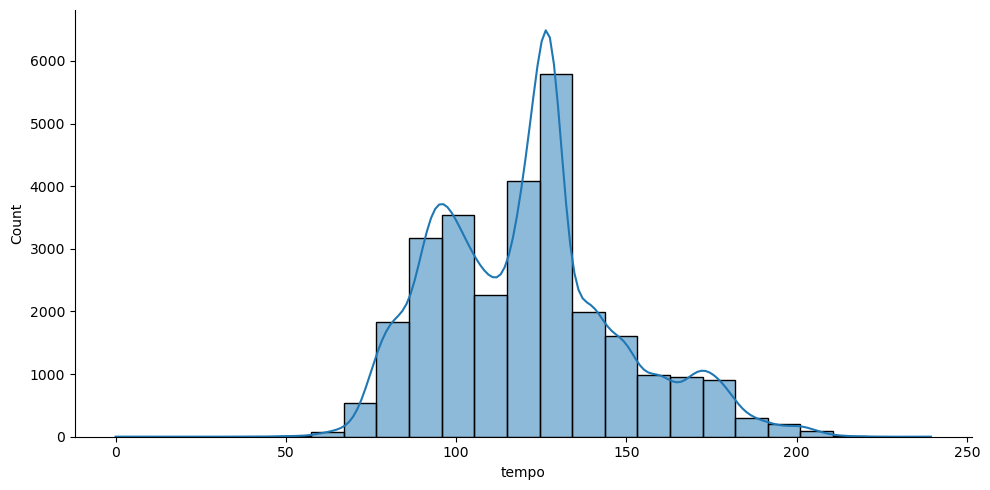

In [41]:
sns.displot(data=df_clean, x='tempo', bins=25, kde=True, aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


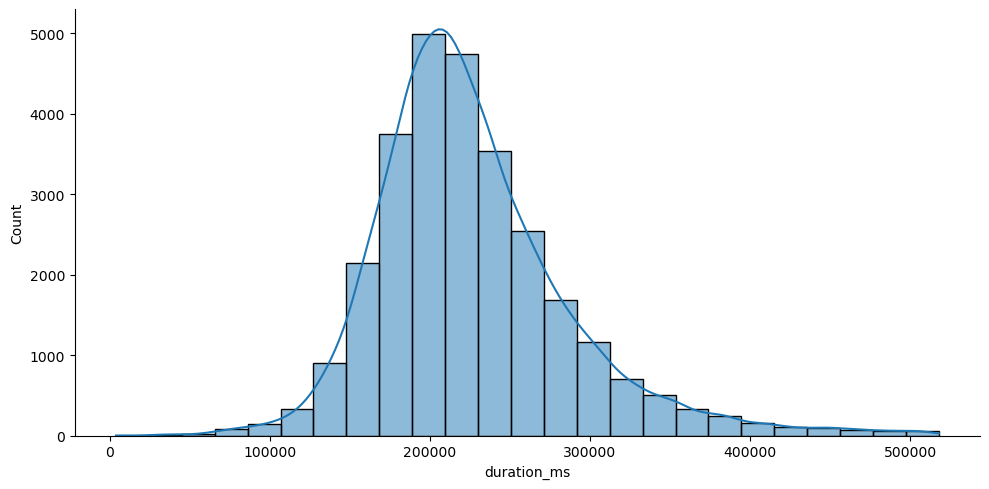

In [42]:
sns.displot(data=df_clean, x='duration_ms', bins=25, kde=True, aspect=2)

plt.show()

#### ii. Categorical variables: Bar charts.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


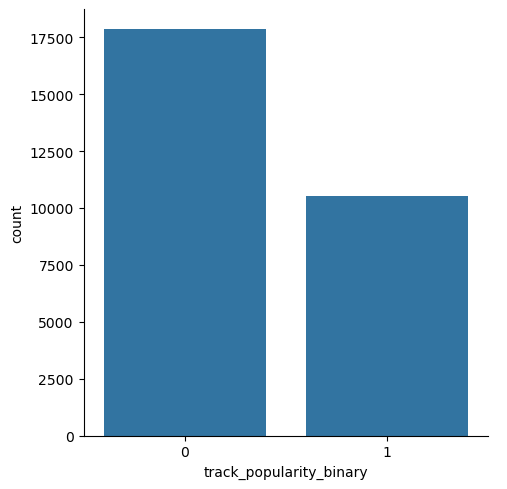

In [43]:
sns.catplot(data=df_clean, x='track_popularity_binary', kind='count')

plt.show()

In [44]:
df_clean.playlist_genre.nunique()

6

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


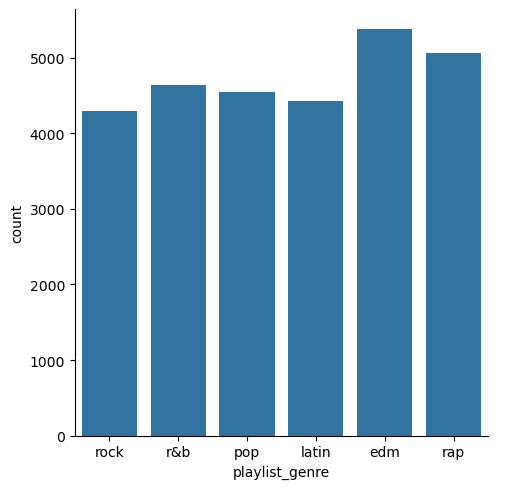

In [45]:
sns.catplot(data=df_clean, x='playlist_genre', kind='count')

plt.show()

Since `playlist_subgenre` has 24 unique values, I will not be using it as a categorical variable directly. Instead, I may explore it through summary statistics or visualizations.

In [46]:
df_clean.playlist_subgenre.nunique()

24

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


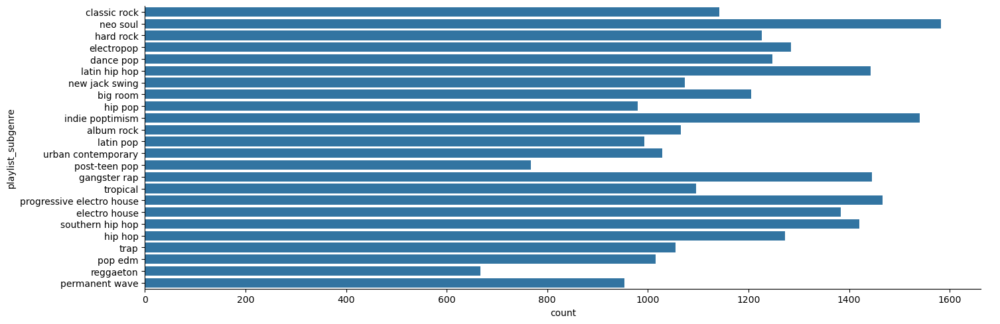

In [47]:
sns.catplot(data=df_clean, y='playlist_subgenre', kind='count', aspect=3)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


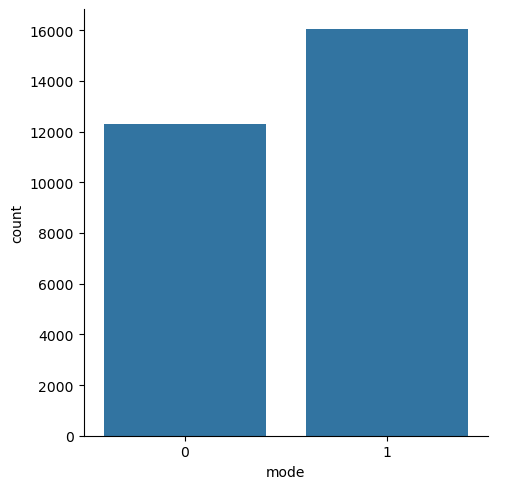

In [48]:
sns.catplot(data=df_clean, x='mode', kind='count')

plt.show()

The musical key D♯/E♭ is the least common, while C and C♯ / D♭ were the most common.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


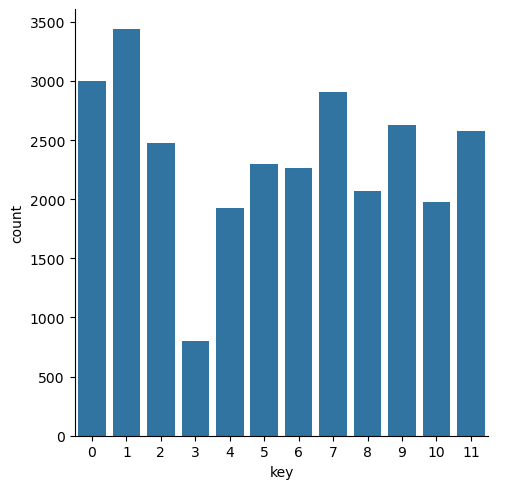

In [49]:
sns.catplot(data=df_clean, x='key', kind='count')

plt.show()

In looking at the bar charts for `track_album_year`, and `track_album_decade`, most of the songs in the data set were released more recently.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


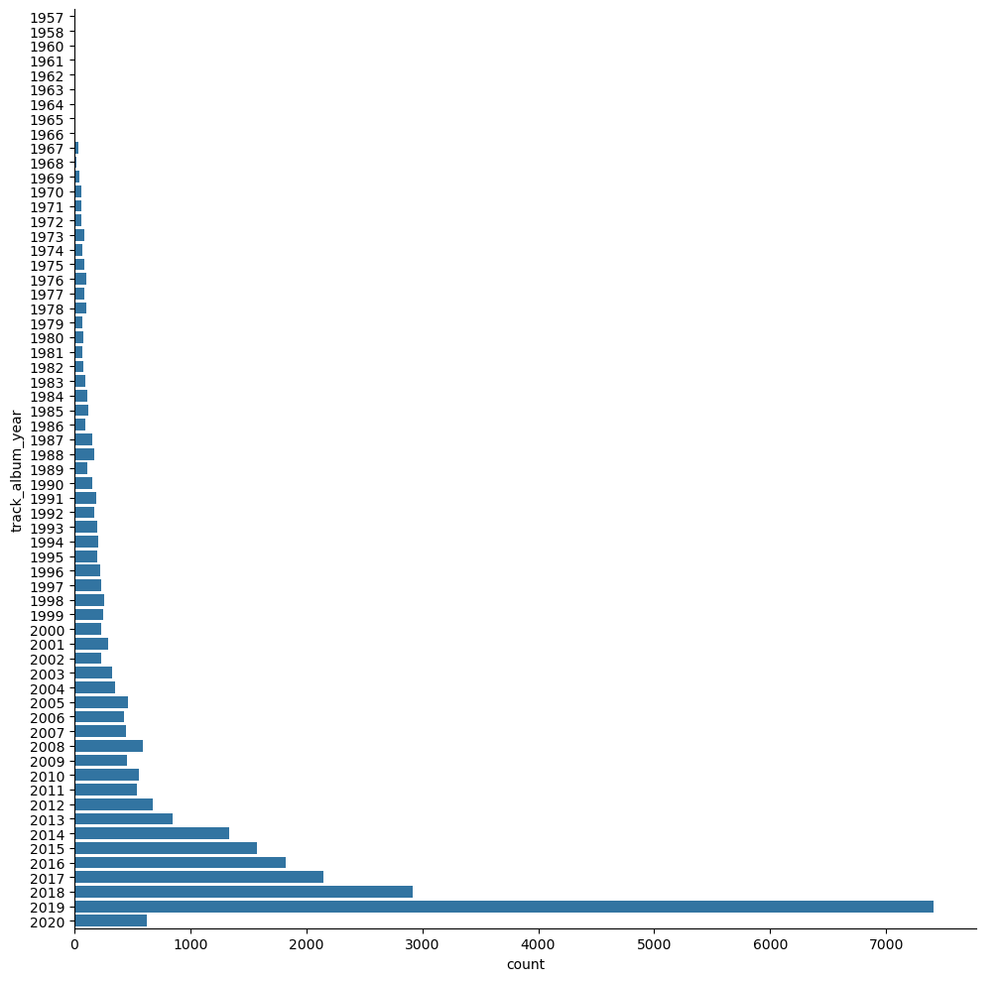

In [50]:
sns.catplot(data=df_clean, y='track_album_year', kind='count', height=10)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


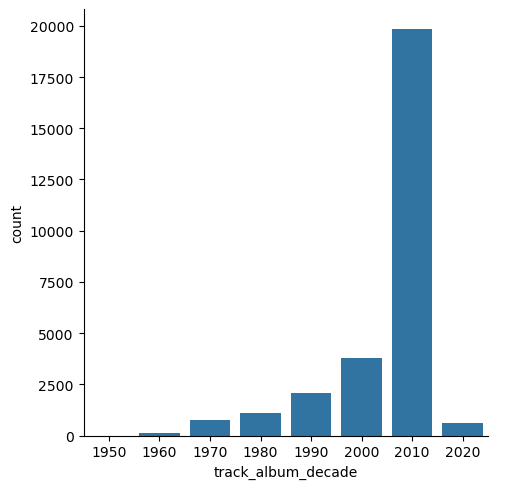

In [51]:
sns.catplot(data=df_clean, x='track_album_decade', kind='count')

plt.show()

### f. You must decide appropriate visualizations to show:

#### i. Categorical-to-categorical relationships (COMBINATIONS). 

First, I will see how each `playlist_genre` favors major vs minor modes using the `mode` as hue. Major is represented by 1 and minor is 0. There is a higher count of major mode tracks for all playlist genres.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


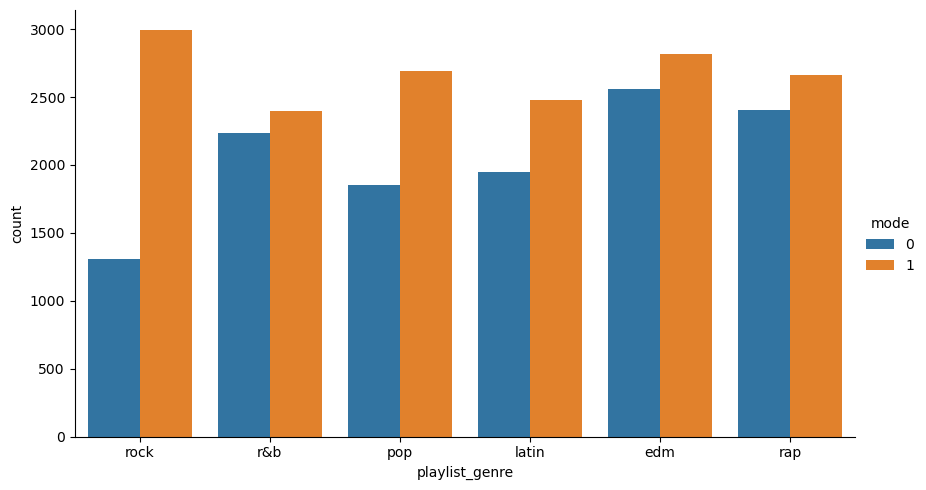

In [52]:
sns.catplot(data = df_clean, x='playlist_genre', hue='mode', kind='count', aspect=1.75)

plt.show()

I also examined the distribution of each key across `playlist_genre`. The key D♯/E♭ is generally less frequent across genres, whereas C♯/D♭ appears most often in the rap genre. The key C is also quite frequent accross several genres.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


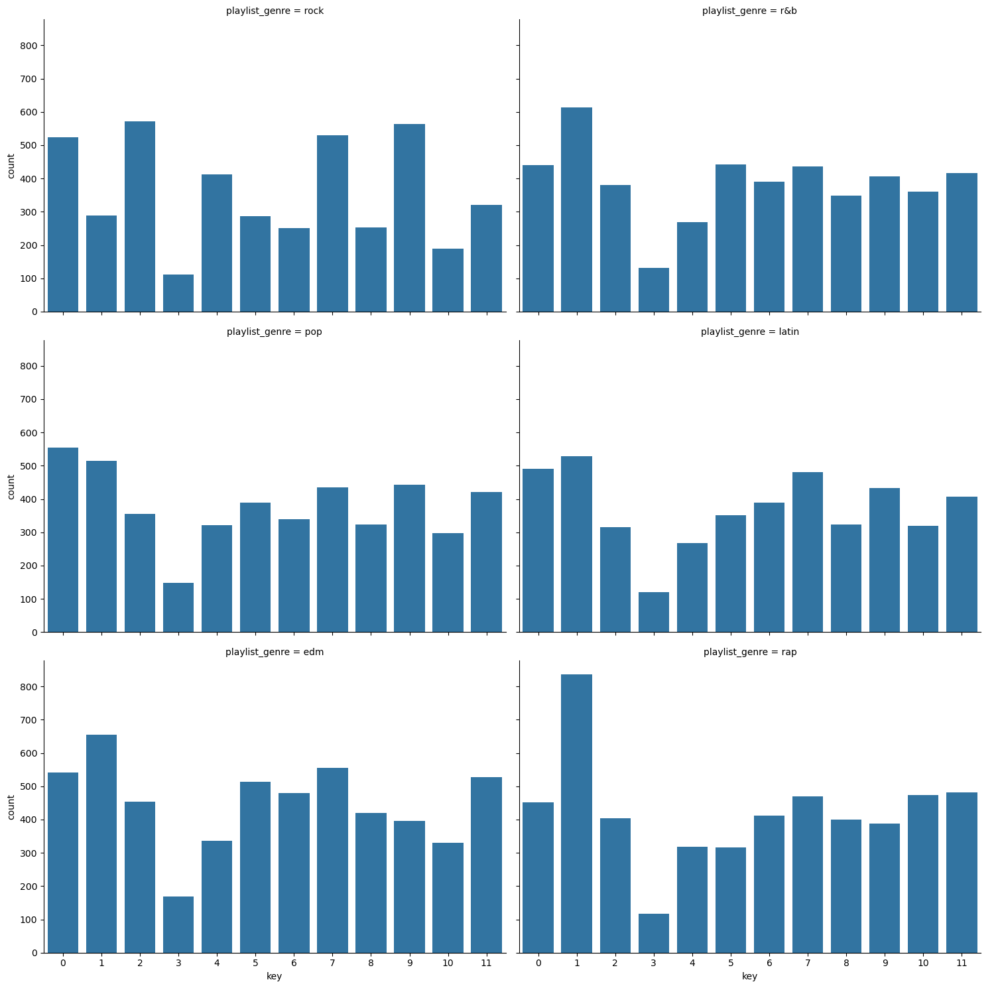

In [53]:
sns.catplot(data = df_clean, x='key', col='playlist_genre', kind='count',
            col_wrap=2, height=5, aspect=1.5)

plt.show()

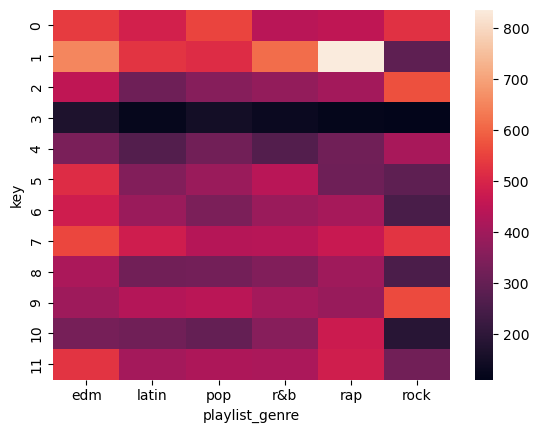

In [54]:
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(df_clean.key, df_clean.playlist_genre), ax=ax)

plt.show()

I will also see how `playlist_genre` and `playlist_subgenre` correlate.

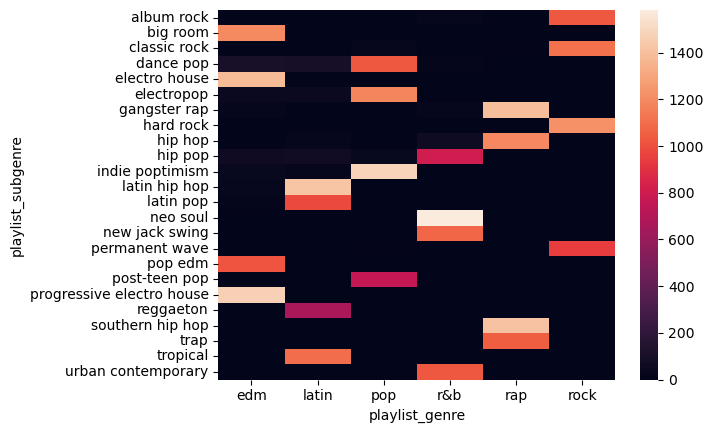

In [55]:
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(df_clean.playlist_subgenre, df_clean.playlist_genre), ax=ax)

plt.show()

I will also take a look at `track_album_decade` and `mode`. Major mode is frequent accross each decade.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


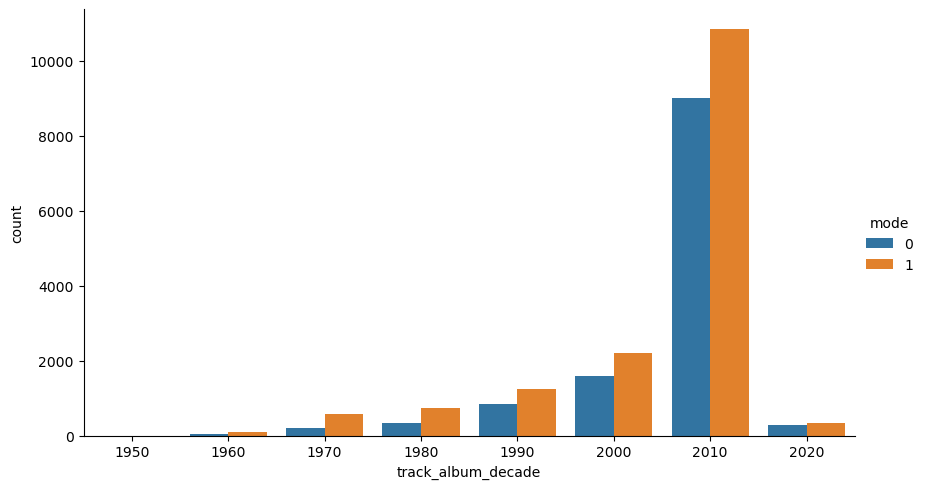

In [56]:
sns.catplot(data = df_clean, x='track_album_decade', hue='mode', kind='count', aspect=1.75)

plt.show()

#### ii. Categorical-to-continuous relationships. 

Several continuous variables are available. For this subsection, I focus on `valence`, which is approximately Gaussian, and `tempo`, which exhibits a bimodal marginal distribution.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


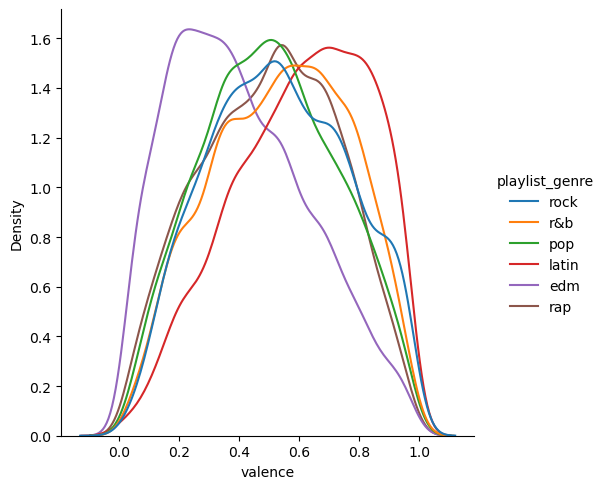

In [57]:
sns.displot(data = df_clean, x='valence', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


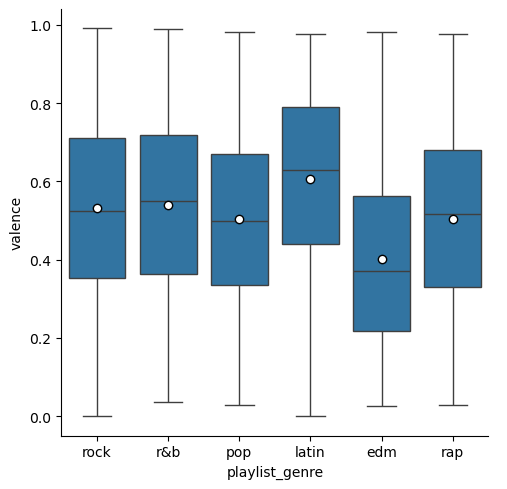

In [58]:
sns.catplot(data = df_clean, x='playlist_genre', y='valence', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/4215063152.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data=df_clean, x='playlist_genre', y='valence', kind='point', join=False)
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


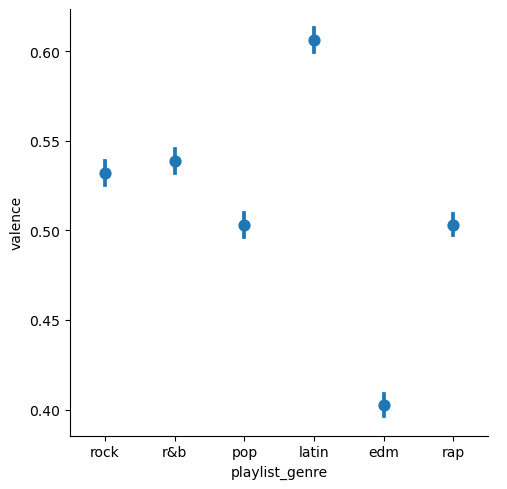

In [59]:
sns.catplot(data=df_clean, x='playlist_genre', y='valence', kind='point', join=False)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


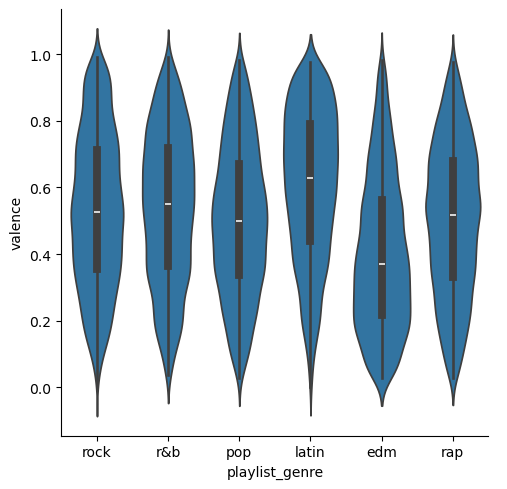

In [60]:
sns.catplot(data = df_clean, x='playlist_genre', y='valence', kind='violin')

plt.show()

Relative to other genres, EDM is heavily concentrated around 115 BPM.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


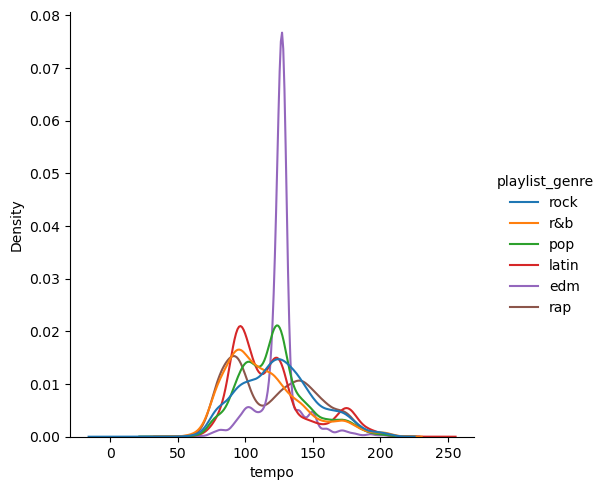

In [61]:
sns.displot(data = df_clean, x='tempo', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


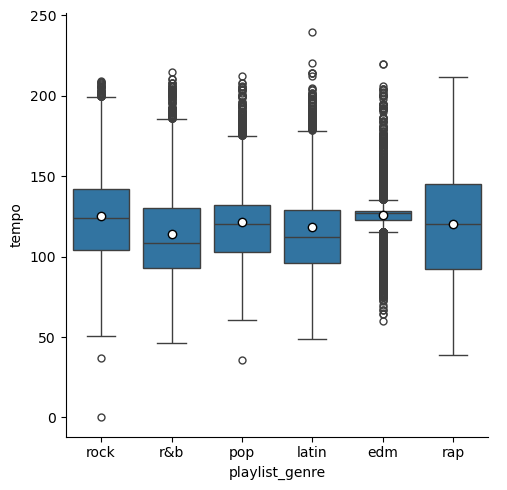

In [62]:
sns.catplot(data = df_clean, x='playlist_genre', y='tempo', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/451821623.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data=df_clean, x='playlist_genre', y='tempo', kind='point', join=False)
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


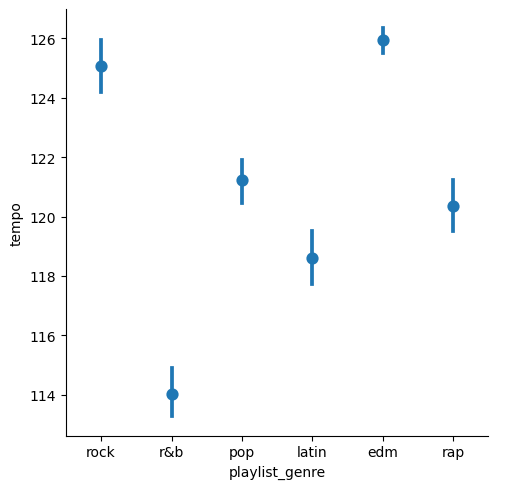

In [63]:
sns.catplot(data=df_clean, x='playlist_genre', y='tempo', kind='point', join=False)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


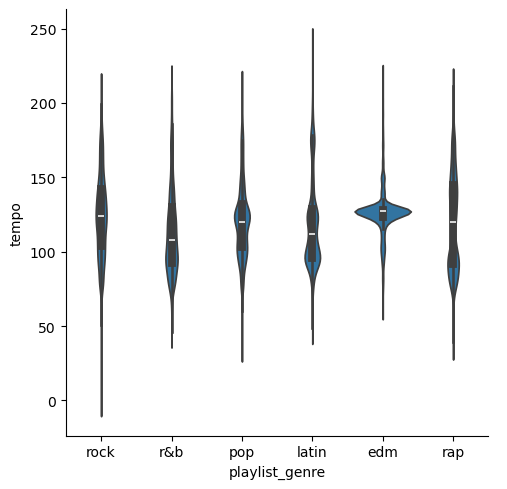

In [64]:
sns.catplot(data = df_clean, x='playlist_genre', y='tempo', kind='violin')

plt.show()

Let's do the histogram approach using the time variable and the a histogram of energy or duration? Using a code like this:

sns.displot(data = df_copy, x='distancemiles', col='direction', col_wrap=4 ,
            facet_kws={'sharex': True, 'sharey': False},
            common_norm=False, kind='hist')

plt.show()

#### iii. Continuous-to-continuous relationships.

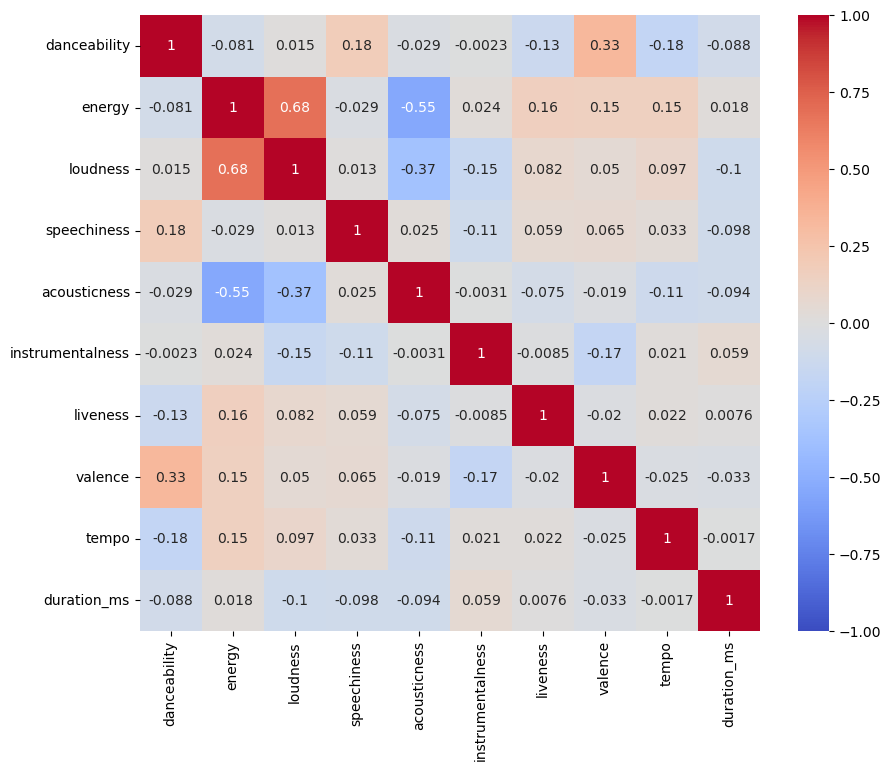

In [65]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(data = df_clean.loc[:, ['danceability','energy','loudness','speechiness','acousticness',
             'instrumentalness','liveness','valence','tempo', 'duration_ms']].corr(),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 10},
            ax=ax)

plt.show()

Since there are several continuous variables, I will do a pairplot for a couple different subsets: *Energy features* and *Energy acoustic features*

*Energy features* pairplot:

In [66]:
energy_features = ['energy', 'loudness', 'danceability', 'valence', 'tempo']

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


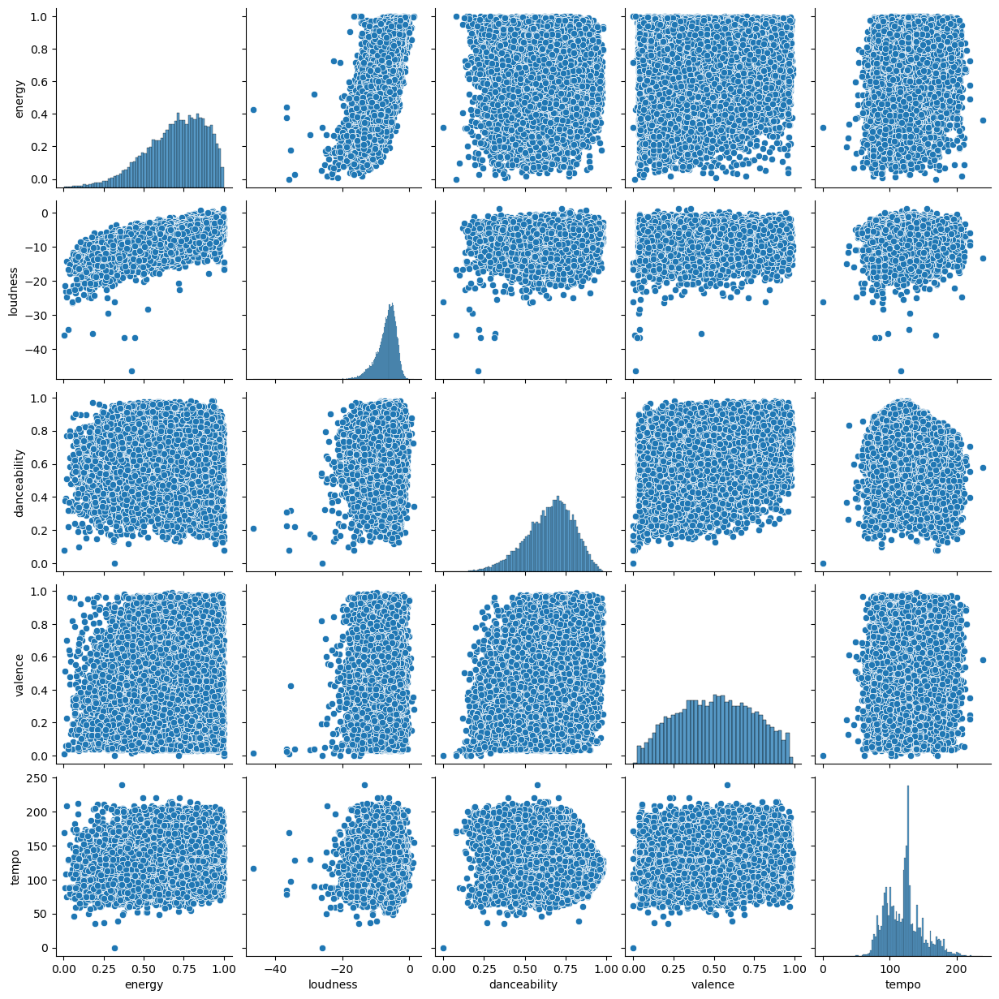

In [67]:
sns.pairplot( data = df_clean, x_vars = energy_features,
             y_vars = energy_features,
             diag_kws={'common_norm': False})

plt.show()

*Energy acoustic features* pairplot:

In [68]:
energy_acoustic_features = ['energy', 'loudness', 'acousticness']

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


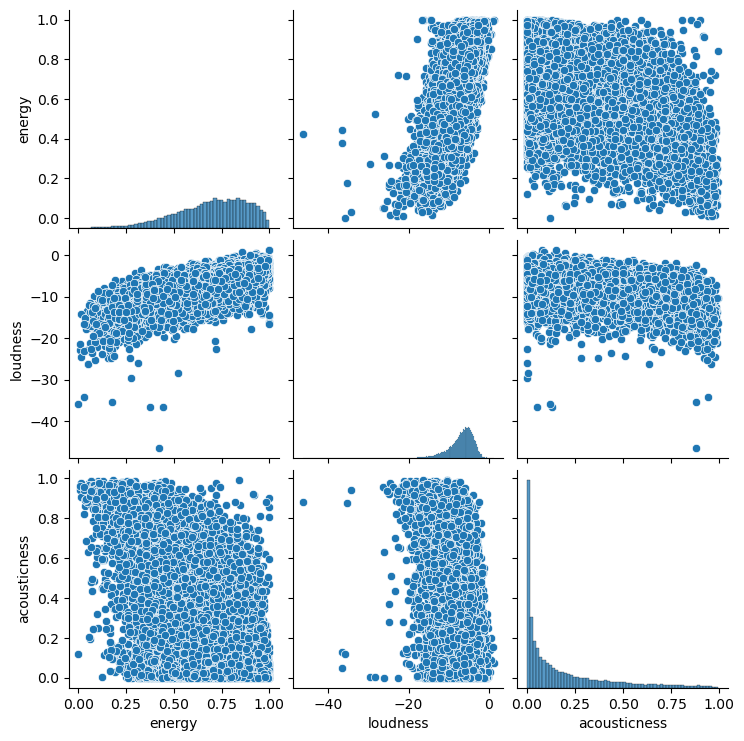

In [69]:
sns.pairplot( data = df_clean, x_vars = energy_acoustic_features,
             y_vars = energy_acoustic_features,
             diag_kws={'common_norm': False})

plt.show()

### g. You must decide appropriate visualizations to show if RELATIONSHIPS change across GROUPS. This is especially important to continuous-to-continuous relationships. Do not forget though that categorical-to-continuous relationships can also be GROUPED BY a secondary categorical variable!

Categorical-to-continuous grouped by `mode`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


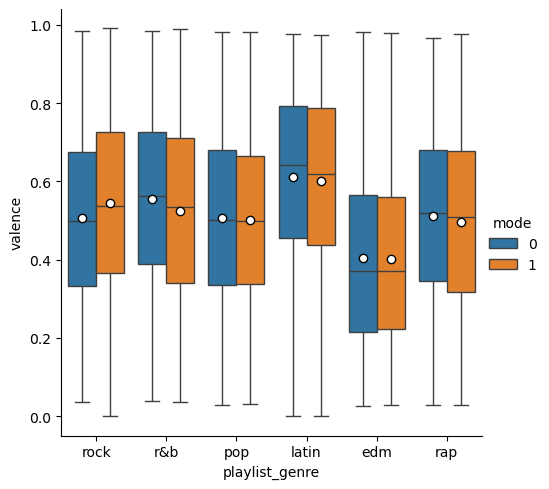

In [70]:
sns.catplot(data = df_clean, x='playlist_genre', y='valence', hue='mode', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/119819812.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data=df_clean, x='playlist_genre', y='valence', hue='mode', kind='point', join=False)
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


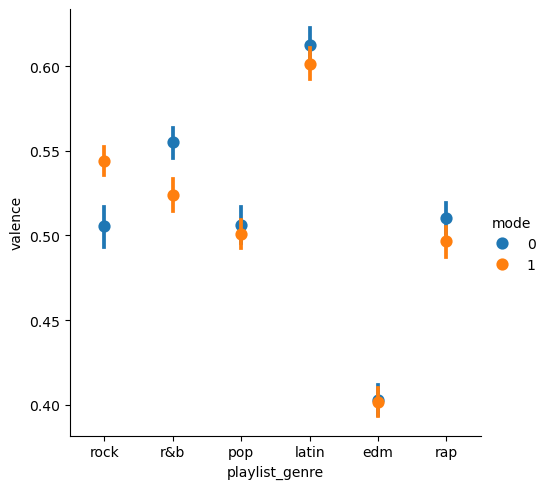

In [71]:
sns.catplot(data=df_clean, x='playlist_genre', y='valence', hue='mode', kind='point', join=False)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


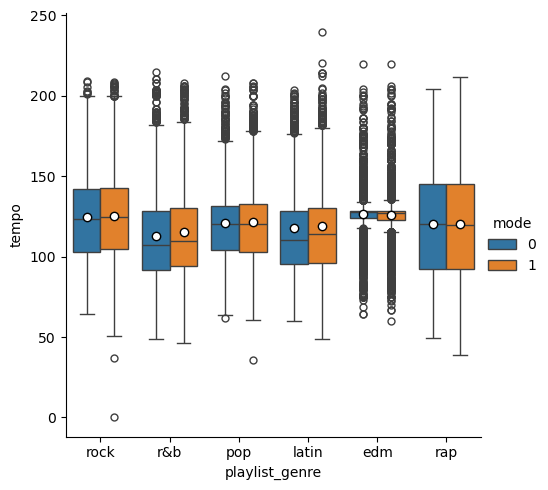

In [72]:
sns.catplot(data = df_clean, x='playlist_genre', y='tempo', hue='mode', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/607108095.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data=df_clean, x='playlist_genre', y='tempo', hue='mode', kind='point', join=False)
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


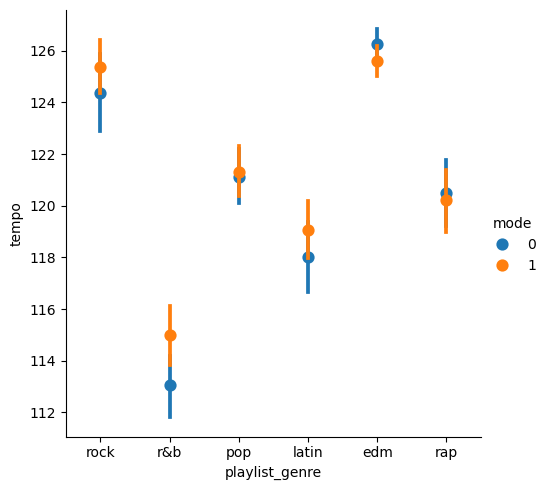

In [73]:
sns.catplot(data=df_clean, x='playlist_genre', y='tempo', hue='mode', kind='point', join=False)

plt.show()

Continuous-to-continuous grouped by `playlist_genre`.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


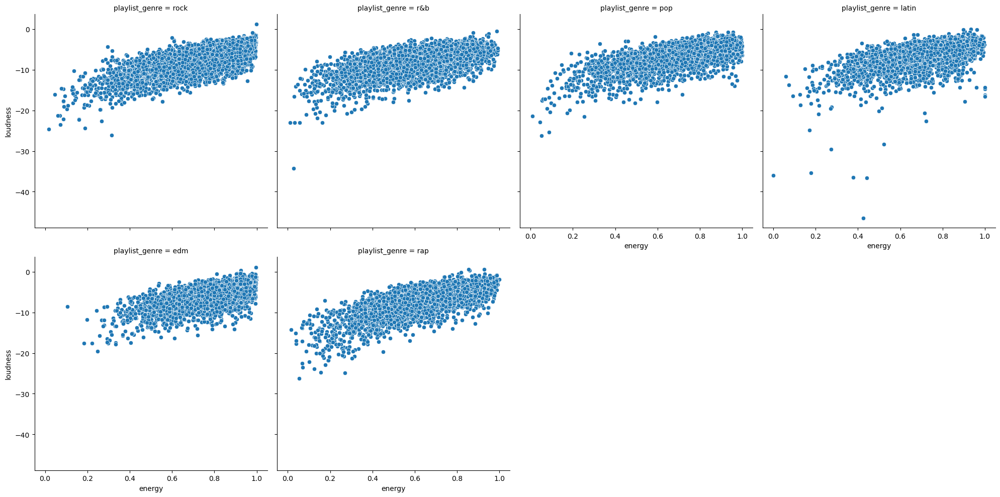

In [74]:
sns.relplot(data = df_clean, x='energy', y='loudness', col = 'playlist_genre', col_wrap = 4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


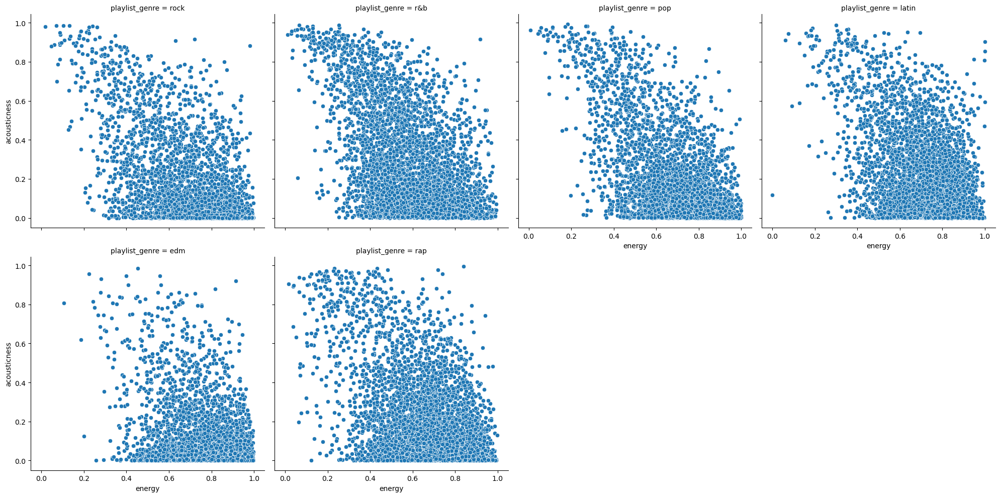

In [75]:
sns.relplot(data = df_clean, x='energy', y='acousticness', col = 'playlist_genre', col_wrap = 4)

plt.show()

### h. If you are working on a REGRESSION problem, you must:  

#### i. Visualize the relationship between the continuous response and the continuous inputs using scatter plots and trend plots. 

#### ii. Group the relationships by categorical variables (if appropriate).  

#### iii. Summarize the response for each unique value of the categorical inputs using boxplots, violin plots, and point plots.

N/A

### i. If you are working on a CLASSIFICATION problem, you must:

First, I will convert the dataframe to longformat.

In [76]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   track_id                             28352 non-null  object        
 1   playlist_name                        28352 non-null  object        
 2   playlist_id                          28352 non-null  object        
 3   playlist_genre                       28352 non-null  object        
 4   playlist_subgenre                    28352 non-null  object        
 5   track_name                           28352 non-null  object        
 6   track_artist                         28352 non-null  object        
 7   track_popularity                     28352 non-null  int64         
 8   track_album_id                       28352 non-null  object        
 9   track_album_name                     28352 non-null  object        
 10  track_albu

In [77]:
df_clean_numeric_names = ['danceability','energy','loudness','speechiness','acousticness',
             'instrumentalness','liveness','valence','tempo', 'duration_ms']

In [78]:
df_clean_object_names = ['track_popularity_binary', 'track_id','playlist_name','playlist_id','playlist_genre','playlist_subgenre',
'track_name','track_artist','track_album_id','track_album_name','track_album_release_date', 'mode', 'key']

In [79]:
df_clean_lf = df_clean.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid']+df_clean_object_names,
    value_vars=df_clean_numeric_names)

In [80]:
df_clean_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283520 entries, 0 to 283519
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   rowid                     283520 non-null  int64  
 1   track_popularity_binary   283520 non-null  int64  
 2   track_id                  283520 non-null  object 
 3   playlist_name             283520 non-null  object 
 4   playlist_id               283520 non-null  object 
 5   playlist_genre            283520 non-null  object 
 6   playlist_subgenre         283520 non-null  object 
 7   track_name                283520 non-null  object 
 8   track_artist              283520 non-null  object 
 9   track_album_id            283520 non-null  object 
 10  track_album_name          283520 non-null  object 
 11  track_album_release_date  283520 non-null  object 
 12  mode                      283520 non-null  int64  
 13  key                       283520 non-null  i

In [81]:
len(df_clean_numeric_names)

10

In [82]:
10*df_clean.shape[0] == df_clean_lf.shape[0]

True

#### i. Visualize conditional distributions of the continuous inputs GROUPED BY the response (outcome) unique values. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


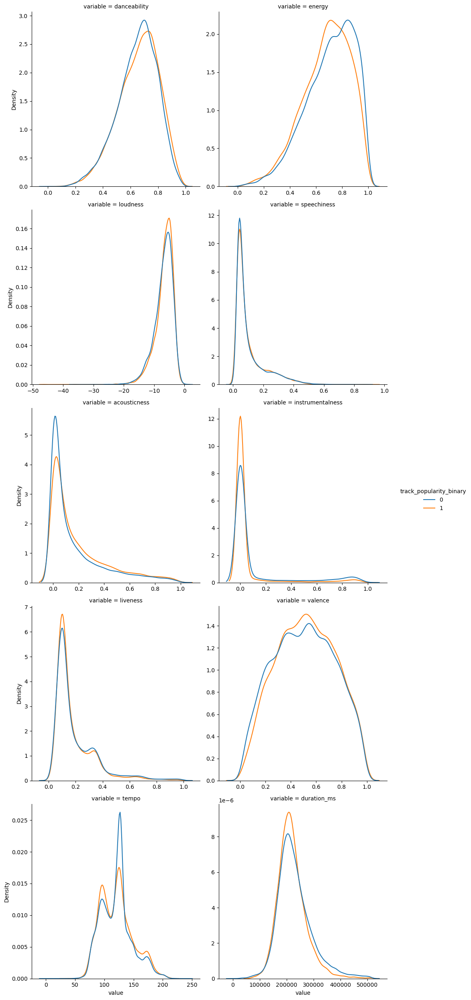

In [83]:
sns.displot(data=df_clean_lf, x='value', col='variable', hue='track_popularity_binary', kind='kde',
            common_norm=False, col_wrap=2,
            facet_kws={'sharex': False, 'sharey': False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


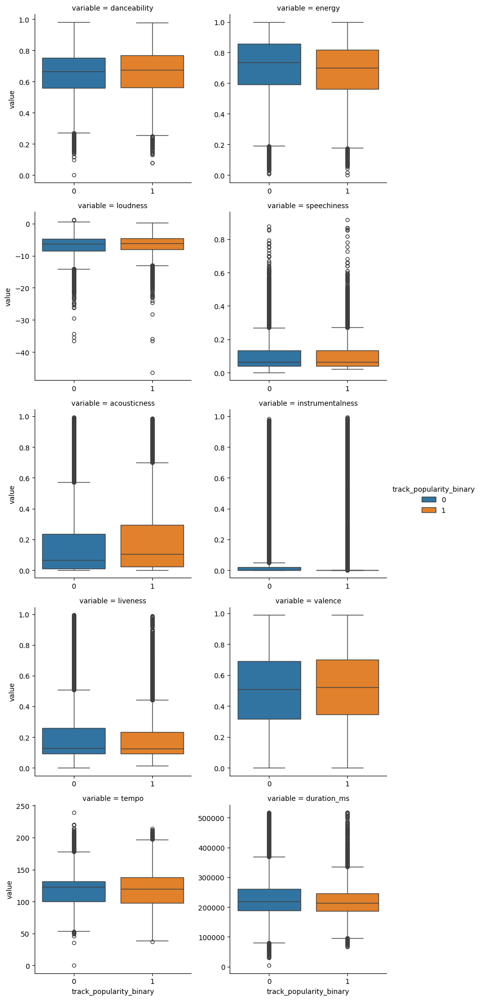

In [84]:
sns.catplot(
    data=df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='box',
    col_wrap=2, height=4,
    sharex=False, sharey=False,
    hue='track_popularity_binary'
)

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/2606960836.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data = df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='point',
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


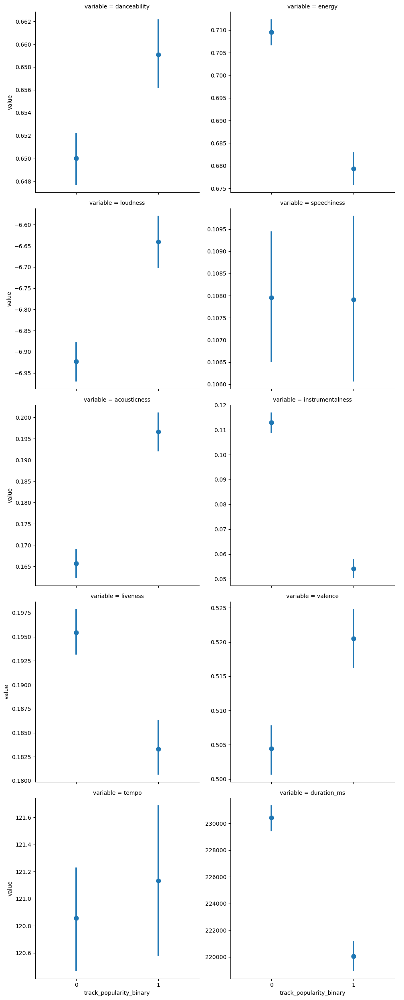

In [85]:
sns.catplot(data = df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='point',
            col_wrap=2, sharey=False, join=False)

plt.show()

#### ii. Visualize relationships between continuous inputs GROUPED BY the response (outcome) unique values.

Similar to the continuous-by-continuous section, I will do a pairplot for two different subsets: *Energy features*, and *Energy acoustic features*

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


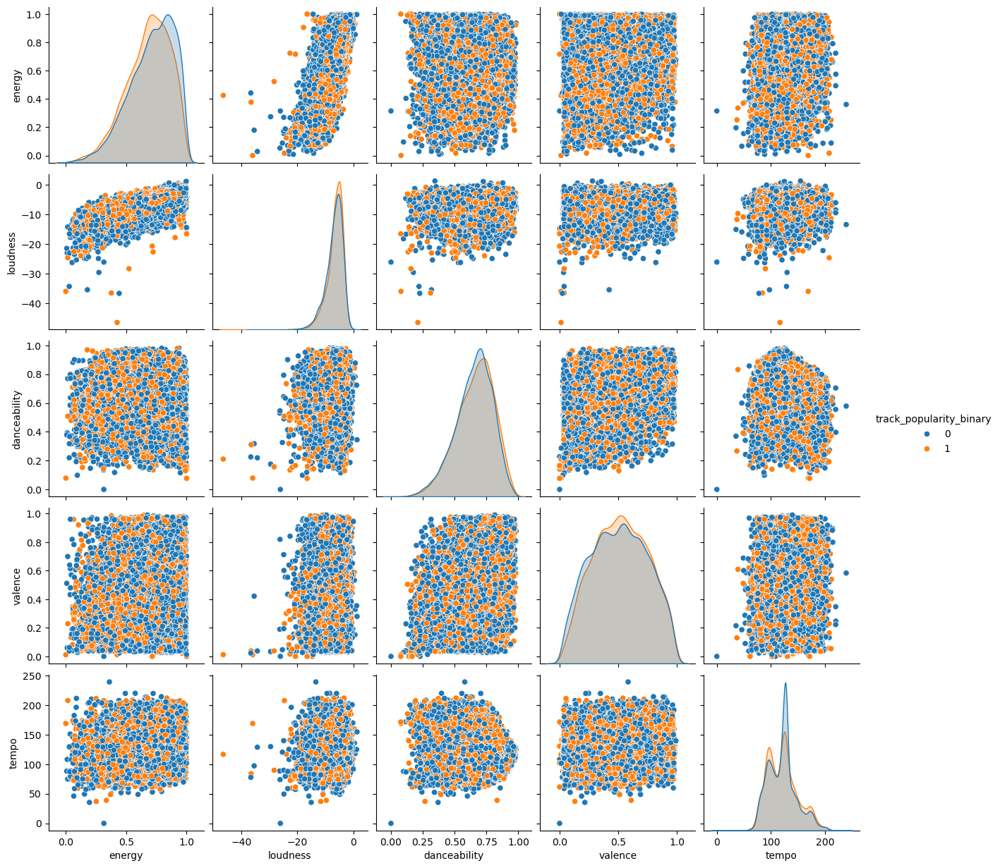

In [86]:
sns.pairplot( data = df_clean, x_vars = energy_features,
             y_vars = energy_features,
             hue='track_popularity_binary',
             diag_kws={'common_norm': False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


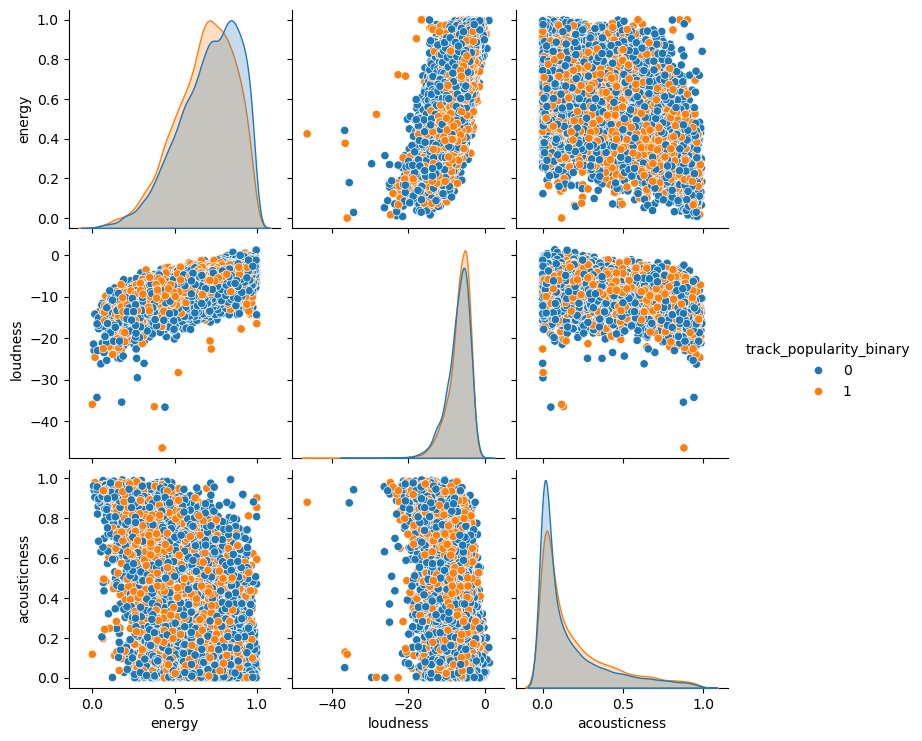

In [87]:
sns.pairplot(data = df_clean, x_vars = energy_acoustic_features,
             y_vars = energy_acoustic_features,
             hue='track_popularity_binary',
             diag_kws={'common_norm': False})

plt.show()

Have a heatmap somewhere around here. 

#### iii. Visualize the counts of combinations between the response (outcome) and categorical inputs. 

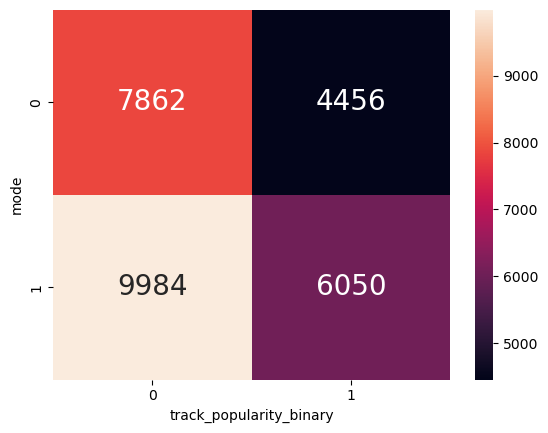

In [145]:
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab( df_clean['mode'], df_clean.track_popularity_binary), ax = ax,
             annot=True, annot_kws={'size': 20}, fmt='d',)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


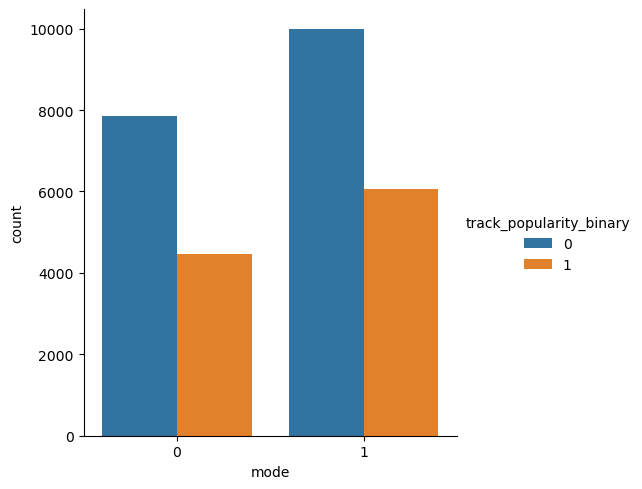

In [89]:
sns.catplot(data = df_clean, x='mode', hue='track_popularity_binary', kind='count')

plt.show()

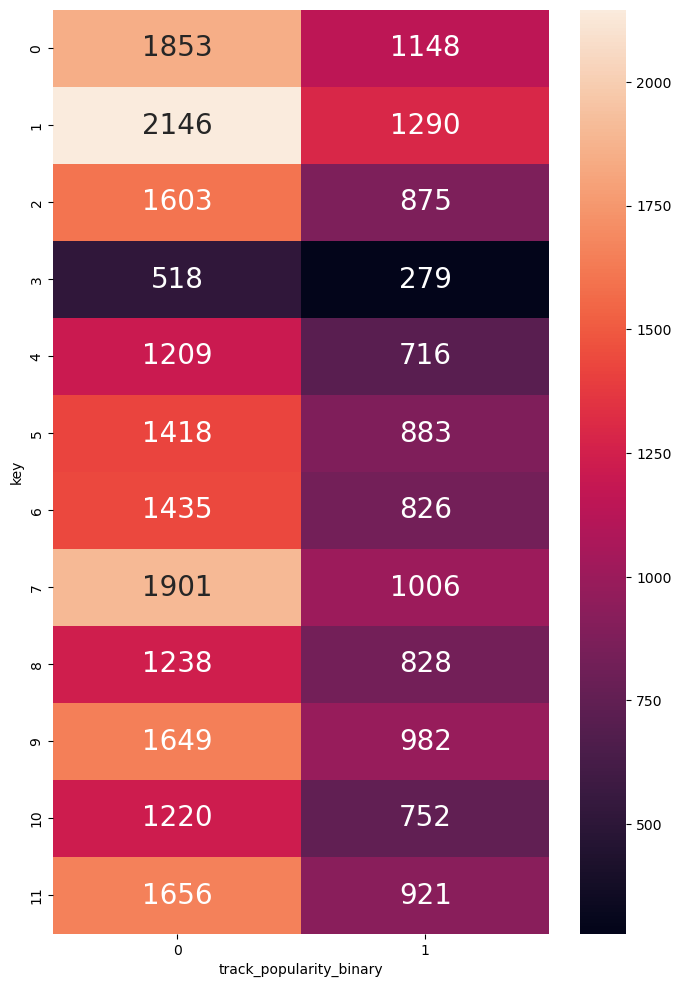

In [90]:
fig, ax = plt.subplots(figsize=(8, 12)) 

sns.heatmap(pd.crosstab(df_clean.key, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


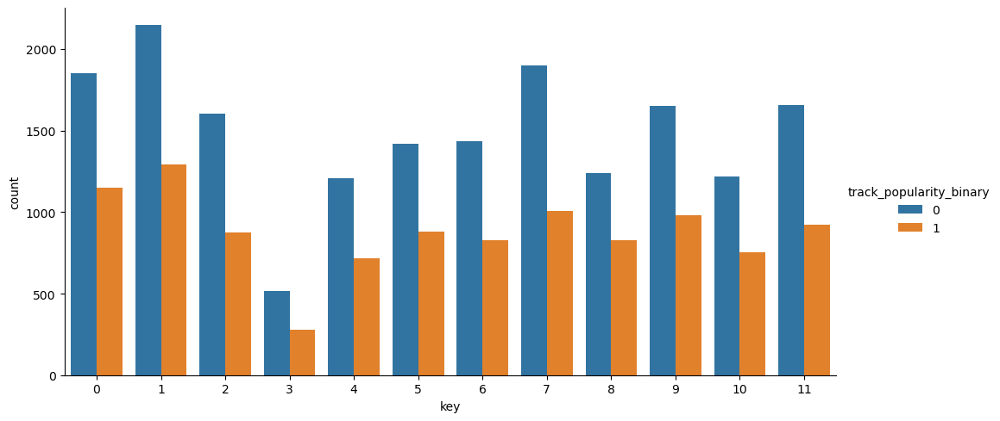

In [91]:
sns.catplot(data = df_clean, x='key', hue='track_popularity_binary', kind='count', aspect=2)

plt.show()

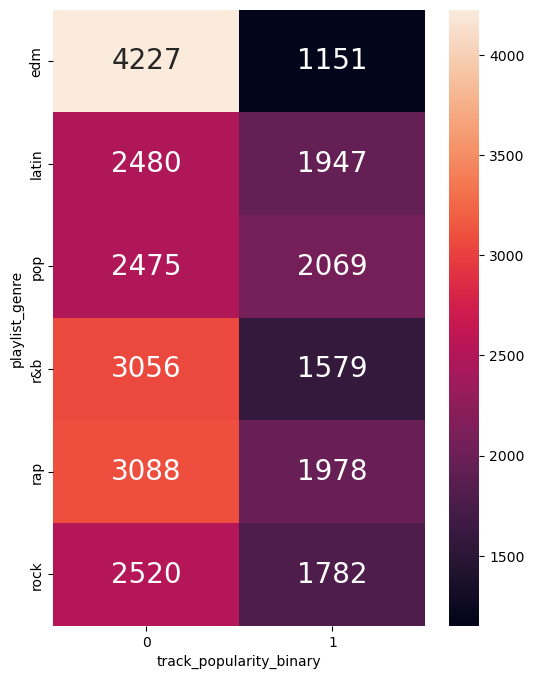

In [92]:
fig, ax = plt.subplots(figsize=(6, 8)) 

sns.heatmap(pd.crosstab(df_clean.playlist_genre, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


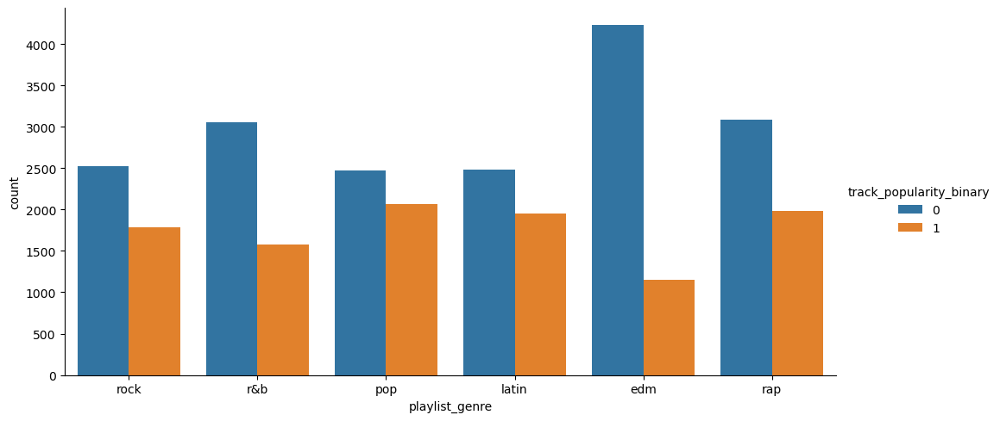

In [93]:
sns.catplot(data = df_clean, x='playlist_genre', hue='track_popularity_binary', kind='count', aspect=2)

plt.show()

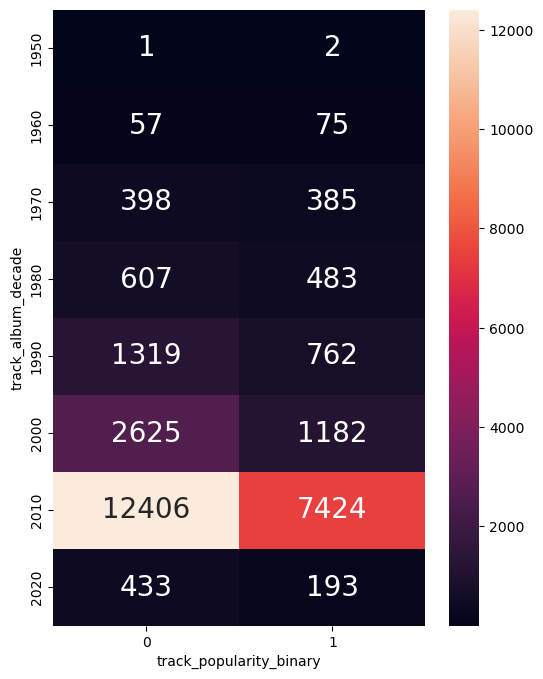

In [148]:
fig, ax = plt.subplots(figsize=(6, 8)) 

sns.heatmap(pd.crosstab(df_clean.track_album_decade, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

## C. Cluster Analysis.  

NOTE: This is an initial attempt at cluster analysis to help you explore the data. You will also perform cluster analysis for the final project submission. The approach you use for the final project might be different from what you try now, but that is okay! Remember that this is just an initial attempt. See what you learn! If it does not seem to reveal anything “useful,” remind yourself that that is okay, and part of the learning process! 

You will NOT apply cluster analysis using ALL variables. Cluster analysis is UNSUPERVISED. It does NOT make distinctions between INPUTS and OUTPUTS. However, the projects are PREDICTIVE ANALYTICS problems with INPUTS and OUTPUTS. Therefore, you will need to decide the class of variables on which you will focus in your cluster analysis. 

### Complete the following setup steps before the requirements that follow.  

### a. Select variables. You MUST state which class of variables you used in your cluster analysis. For example, you could: 

#### i. Cluster using CONTINUOUS inputs. 

#### ii. Cluster using CONTINUOUS responses (if you have multiple outputs). 

#### iii. Cluster using multiple summary statistics derived from inputs. For example, if your data includes MANY categorical variables consider GROUPING BY them and SUMMARIZING the OTHER inputs. Summary statistics to consider: number of unique values, mean, standard deviation, median, etc.  

##### 1. If you do this, do NOT start by creating COMBINATIONS of ALL categorical inputs. Select a few which provide many COMBINATIONS. 

#### iv. Cluster using multiple summary statistics derived from the outputs. For example, if your data includes MANY categorical variables consider GROUPING BY them and SUMMARIZING the outputs. Summary statistics to consider: number of unique values, mean, standard deviation, median, etc.  

##### 1. If you do this, do NOT start by creating COMBINATIONS of ALL categorical inputs. Select a few which provide many COMBINATIONS. 

I will use five continuous variables for clustering: `energy`, `loudness`, `danceability`, `valence`, `tempo`

### b. Consider the following for your cluster analysis:  

#### i. How many variables are you using relative to the number of observations? 

The total number of observations is is 28,352. The total number of variables is five.

In [94]:
df_clean.shape[0]

28352

#### ii. Are the variables you are using “Gaussian-like” or are the distributions “odd looking”? You must visualize the MARGINAL histograms of the variables IF you are using summary statistics derived from INPUTS or OUTPUTS. If you are using the INPUTS or OUTPUTS directly, you already visualized the MARGINAL distributions. 

`energy` and `danceability` are mostly Gaussian-like, with a slight skew to the right. `loudness` is more skewed to the right. `valence` is the most Gaussian-like, and `tempo` has two peaks.

#### iii. Are the variables you are using highly correlated to each other? You must visualize the relationships between the variables you are using. If you are using the INPUTS/OUTPUTS directly then you already visualized those relationships. 

`energy` and `loudness` have a strong correlation. `danceability` and `valence` have a weak correlation. The remaining variable correlations are very weak. 

#### iv. How should you handle missing values? If you drop all rows with at least one missing value, how many observations would you still have (thus, how many complete cases do you have)? 

I dropped the missing values earlier in section B. Initially, there were only 5 missing values for 3 of the columns, so I am still left with 28,352 observations.

In [95]:
df_clean.isna().sum()

track_id                               0
playlist_name                          0
playlist_id                            0
playlist_genre                         0
playlist_subgenre                      0
track_name                             0
track_artist                           0
track_popularity                       0
track_album_id                         0
track_album_name                       0
track_album_release_date               0
danceability                           0
energy                                 0
key                                    0
loudness                               0
mode                                   0
speechiness                            0
acousticness                           0
instrumentalness                       0
liveness                               0
valence                                0
tempo                                  0
duration_ms                            0
track_album_release_date_normalized    0
track_album_rele

## Now that you have completed the setup steps, complete the following requirements:  

#### c. You must use KMeans to execute the Cluster analysis.

First, I will preprocess for KMeans.

In [96]:
df_clean_cluster = df_clean[['energy', 'loudness', 'danceability', 'valence', 'tempo']]

In [97]:
df_clean_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   energy        28352 non-null  float64
 1   loudness      28352 non-null  float64
 2   danceability  28352 non-null  float64
 3   valence       28352 non-null  float64
 4   tempo         28352 non-null  float64
dtypes: float64(5)
memory usage: 1.1 MB


I will visualize the `df_clean_cluster` dataset using a boxplot.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


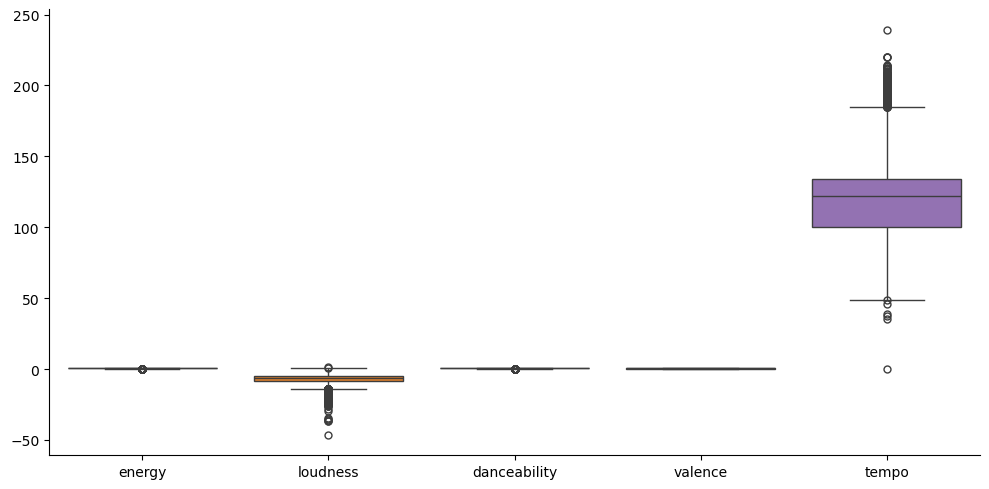

In [98]:
sns.catplot(data = df_clean_cluster, kind='box', aspect=2)

plt.show()

These input variables are not at similar magnitudes and scales, so I will need to standardize them to bring them to the same scale

In [99]:
df_clean_cluster.describe()

,energy,loudness,danceability,valence,tempo
count,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000
mean,0.698373,-6.817777,0.653375,0.510386,120.958219
std,0.183508,3.036433,0.145791,0.234344,26.954502
min,0.000175,-46.448000,0.000000,0.000000,0.000000
25%,0.579000,-8.310250,0.561000,0.329000,99.972000
50%,0.722000,-6.261000,0.670000,0.512000,121.993500
75%,0.843000,-4.708750,0.760000,0.695000,133.999000
max,1.000000,1.275000,0.983000,0.991000,239.440000


In [100]:
from sklearn.preprocessing import StandardScaler

In [101]:
Xdf = StandardScaler().fit_transform(df_clean_cluster)

In [102]:
Xdf.shape

(28352, 5)

In [103]:
df_clean_cluster.shape

(28352, 5)

In [104]:
pd.DataFrame(Xdf, columns=df_clean_cluster.columns).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   energy        28352 non-null  float64
 1   loudness      28352 non-null  float64
 2   danceability  28352 non-null  float64
 3   valence       28352 non-null  float64
 4   tempo         28352 non-null  float64
dtypes: float64(5)
memory usage: 1.1 MB


After standardization, the magnitude and scale of the input variables are fairly similar, with the exception of some extreme outliers.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


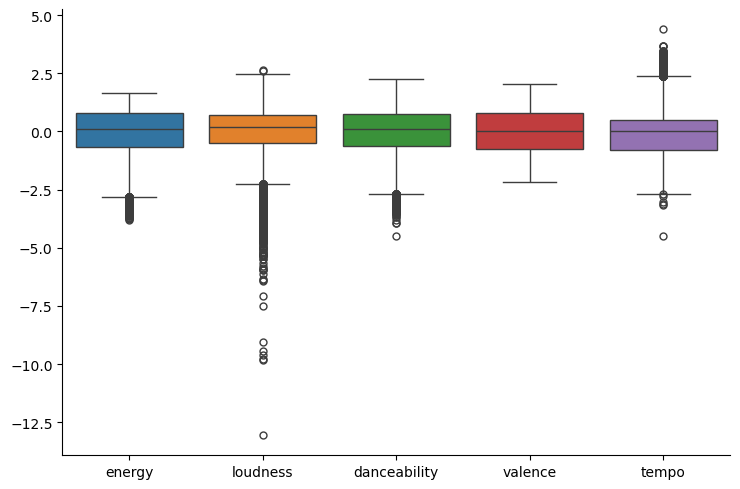

In [105]:
sns.catplot(data = pd.DataFrame(Xdf, columns=df_clean_cluster.columns), kind='box', aspect=1.5, height=5)

plt.show()

To reduce the influence of extreme outliers, I clipped all standardized values to fall within -3 and 3. These thresholds were chosen because, in a standardized scale, values beyond three standard deviations can affect the clustering. This approach helps limit the effect of outliers on the clustering.

In [106]:
Xdf = Xdf.clip(-3, 3)

After removing outliers, the magnitude and scale of the input variables are at similar level. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


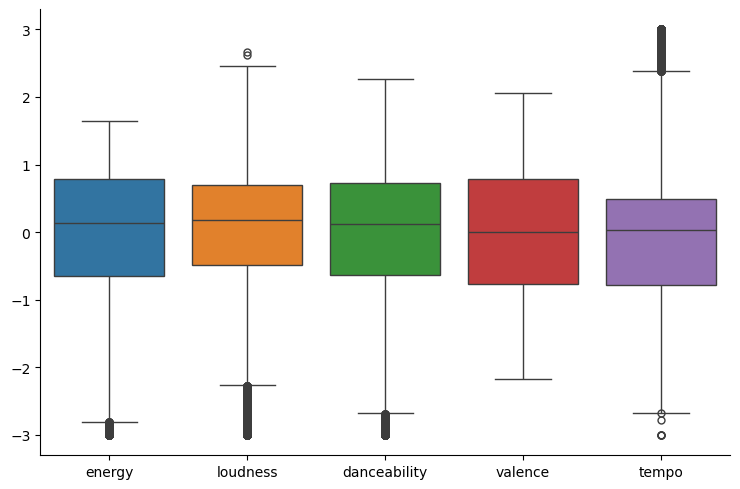

In [107]:
sns.catplot(data = pd.DataFrame(Xdf, columns=df_clean_cluster.columns), kind='box', aspect=1.5, height=5)

plt.show()

### d. First, use 2 clusters.

In [108]:
from sklearn.cluster import KMeans

In [109]:
clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(Xdf)

In [110]:
clusters_2.shape

(28352,)

In [111]:
df_clean_cluster_copy = df_clean_cluster.copy()

In [112]:
df_clean_cluster_copy['k2'] = pd.Series(clusters_2, index=df_clean_cluster.index ).astype('category')

In [113]:
df_clean_cluster_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   energy        28352 non-null  float64 
 1   loudness      28352 non-null  float64 
 2   danceability  28352 non-null  float64 
 3   valence       28352 non-null  float64 
 4   tempo         28352 non-null  float64 
 5   k2            28352 non-null  category
dtypes: category(1), float64(5)
memory usage: 1.1 MB


#### i. Count the number of observations per identified cluster. Are the clusters balanced? 

The clusters are moderately balanced but could be more balanced.

In [114]:
df_clean_cluster_copy.k2.value_counts()

k2
0    17977
1    10375
Name: count, dtype: int64

In [115]:
df_clean_cluster_copy.k2.value_counts(normalize=True)

k2
0    0.634065
1    0.365935
Name: proportion, dtype: float64

#### ii. Visualize the cluster results between 2 of the variables used for the cluster analysis. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


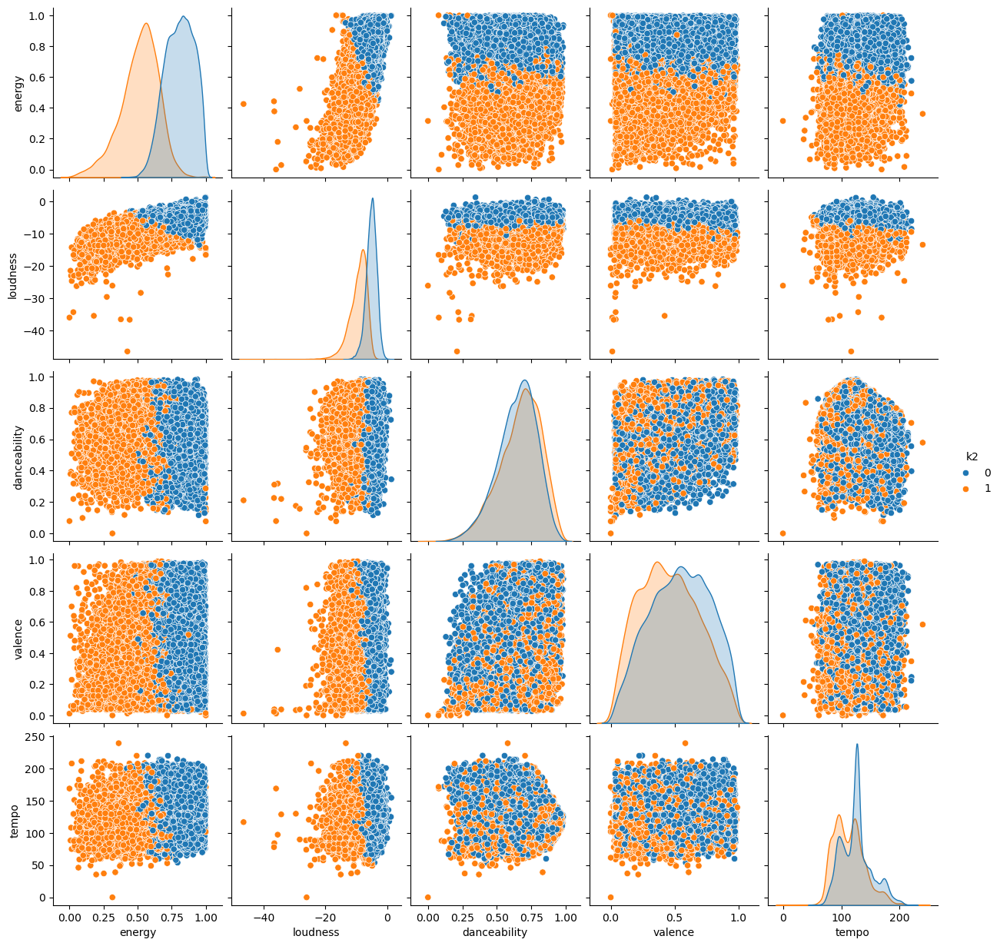

In [116]:
sns.pairplot(data = df_clean_cluster_copy, hue='k2', diag_kws={'common_norm': False})

plt.show()

### e. Then, identify the optimal number of clusters, and rerun KMeans for the optimal number

The range of k = 1–10 was selected to view potential clustering count.

In [117]:
tots_within = []

K = range(1, 11)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit(Xdf)
    
    tots_within.append( km.inertia_ )

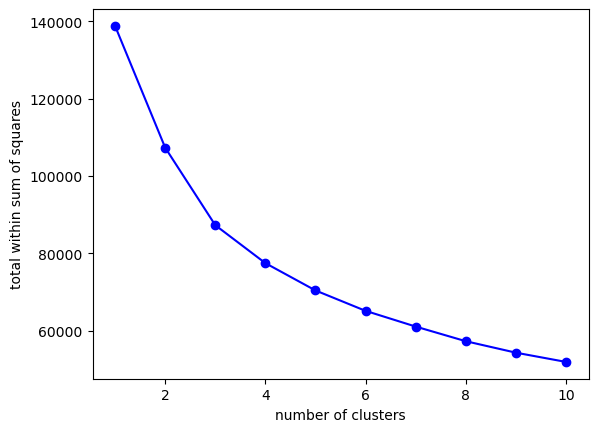

In [118]:
fig, ax = plt.subplots()

ax.plot( K, tots_within, 'bo-' )
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

The sharp drop seems to diminish after 3 clusters. Therefore, k = 3 appears to be a reasonable choice for the number of clusters.

Executing KMeans using 3 clusters.

In [119]:
clusters_3 = KMeans(n_clusters=3, random_state=121, n_init=25, max_iter=500).fit_predict(Xdf)

In [120]:
df_clean_cluster_copy['k3'] = pd.Series(clusters_3, index=df_clean_cluster.index ).astype('category')

In [121]:
df_clean_cluster_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   energy        28352 non-null  float64 
 1   loudness      28352 non-null  float64 
 2   danceability  28352 non-null  float64 
 3   valence       28352 non-null  float64 
 4   tempo         28352 non-null  float64 
 5   k2            28352 non-null  category
 6   k3            28352 non-null  category
dtypes: category(2), float64(5)
memory usage: 1.1 MB


#### i. Count the number of observations per identified cluster. 

In [122]:
df_clean_cluster_copy.k3.value_counts()

k3
0    11449
2     9534
1     7369
Name: count, dtype: int64

In [123]:
df_clean_cluster_copy.k3.value_counts(normalize=True)

k3
0    0.403816
2    0.336273
1    0.259911
Name: proportion, dtype: float64

k3 clusters are more balanced than k2 clusters.

#### ii. Visualize the cluster results between 2 of the variables used for the cluster analysis. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


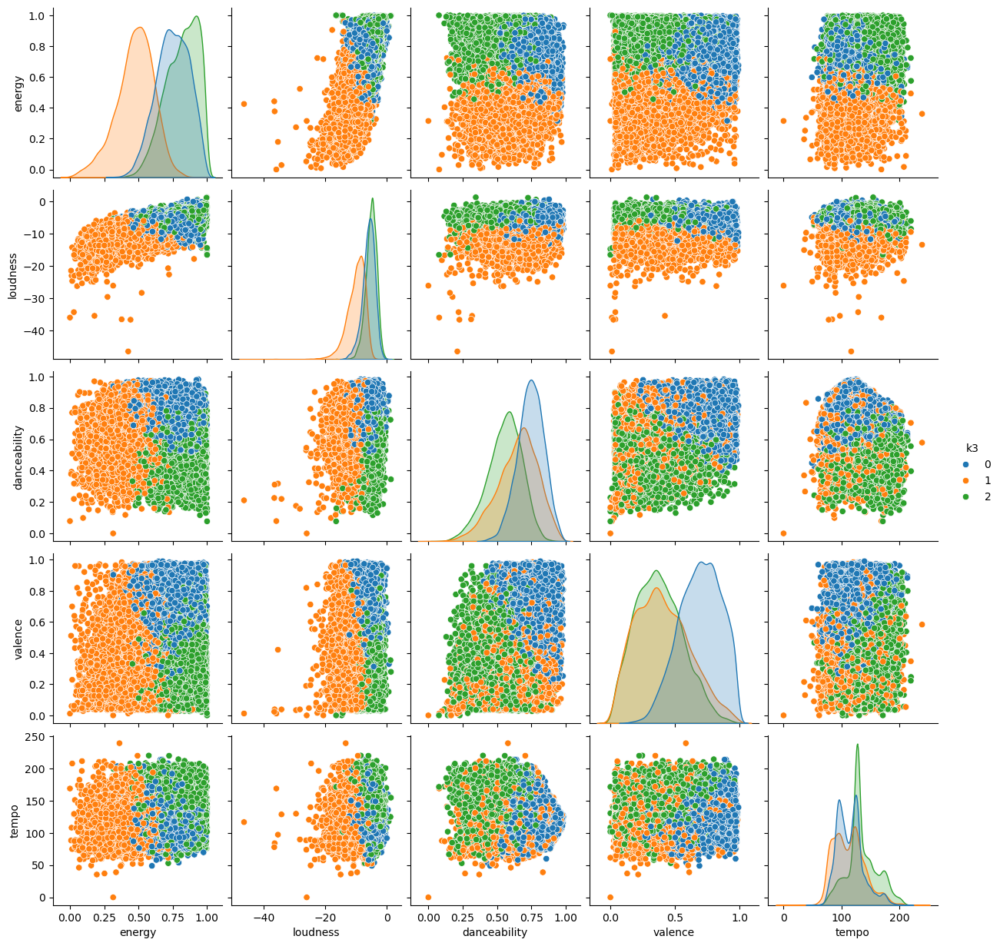

In [124]:
sns.pairplot(data = df_clean_cluster_copy, hue='k3', diag_kws={'common_norm': False})

plt.show()

### f. Interpret:  

#### i. Do the OPTIMAL number of clusters ALIGN with CATEGORIES of KNOWN grouping variables in your data? 

##### 1. If you are working on a CLASSIFICATION problem, are the identified clusters consistent with the outcome categories? 

K=3 clusters does not align with the binary popularity variable. Each cluster contains a similar mix of popular and unpopular tracks.


##### 2. If you are working on a REGRESSION problem, are the identified clusters consistent with categories of a categorical input?

N/A

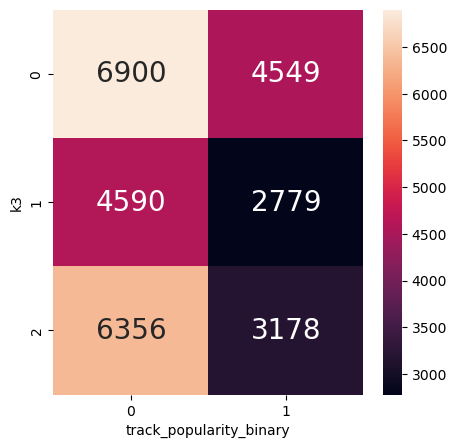

In [125]:
fig, ax = plt.subplots(figsize=(5, 5)) 

sns.heatmap(pd.crosstab(df_clean_cluster_copy.k3, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

### ii. What are the CONDITIONAL distributions of the variables you used for clustering GIVEN the identified clusters? 

#### 1. Use appropriate visualizations to study the CONDITIONAL distributions of the variables used for clustering GROUPED BY the identified clusters. 

#### 2. HINT: you are creating CONDITIONAL distributions using the DERIVED cluster groupings rather than using a “real” categorical variable. 

#### 3. Describe the clusters based on the CONDITIONAL distributions. 

From the histograms, I found that the directions of the skewness are different for the two clusters for each variable.

From the box plot, the bodies of the boxes for `energy` and `loudness` under the two newly created clusters didn't overlap, meaning the two clusters are different and meaningful for these variables.

From the point plots, the two clusters have clearly different means because their confidence intervals didn't overlap with each other.

From the scatterplots with `k2` as hue and `track_popularity_binary` as style, K=2 clusters do not align clearly with the binary popularity variable, as each cluster contains a similar mix of popular and unpopular tracks.

In [126]:
df_clean_cluster_copy['track_popularity_binary'] = df_clean.track_popularity_binary

In [127]:
df_clean_cluster_copy_numeric = ['energy', 'loudness', 'danceability', 'valence', 'tempo']

In [128]:
df_clean_cluster_copy_object = ['k2', 'k3', 'track_popularity_binary']

In [129]:
df_clean_cluster_copy_lf = df_clean_cluster_copy.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid']+df_clean_cluster_copy_object,
    value_vars=df_clean_cluster_copy_numeric)

In [130]:
df_clean_cluster_copy_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141760 entries, 0 to 141759
Data columns (total 6 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   rowid                    141760 non-null  int64   
 1   k2                       141760 non-null  category
 2   k3                       141760 non-null  category
 3   track_popularity_binary  141760 non-null  int64   
 4   variable                 141760 non-null  object  
 5   value                    141760 non-null  float64 
dtypes: category(2), float64(1), int64(2), object(1)
memory usage: 4.6+ MB


In [131]:
len(df_clean_cluster_copy_numeric)

5

In [132]:
5*df_clean_cluster_copy.shape[0] == df_clean_cluster_copy_lf.shape[0]

True

I will compare the cluster analysis using two clusters since there is one output variable `track_popularity_binary` with two categories.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


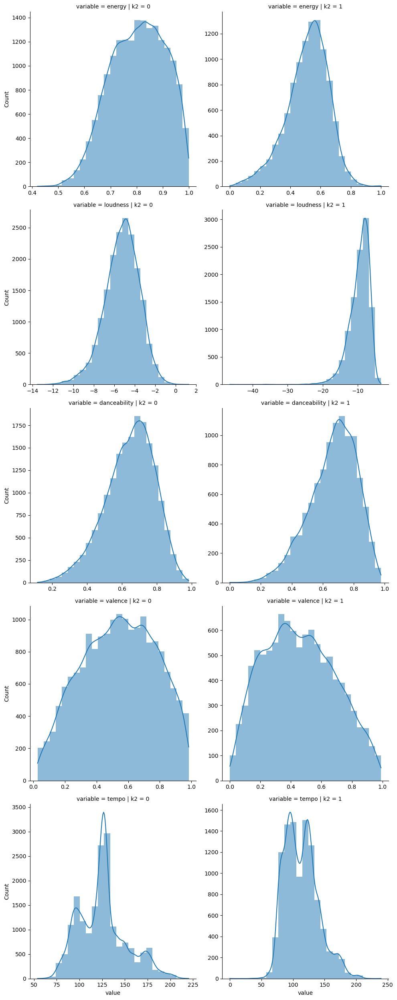

In [133]:
sns.displot(data = df_clean_cluster_copy_lf, x='value', col='k2', row='variable', bins=25, kind='hist', 
            kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins = False)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


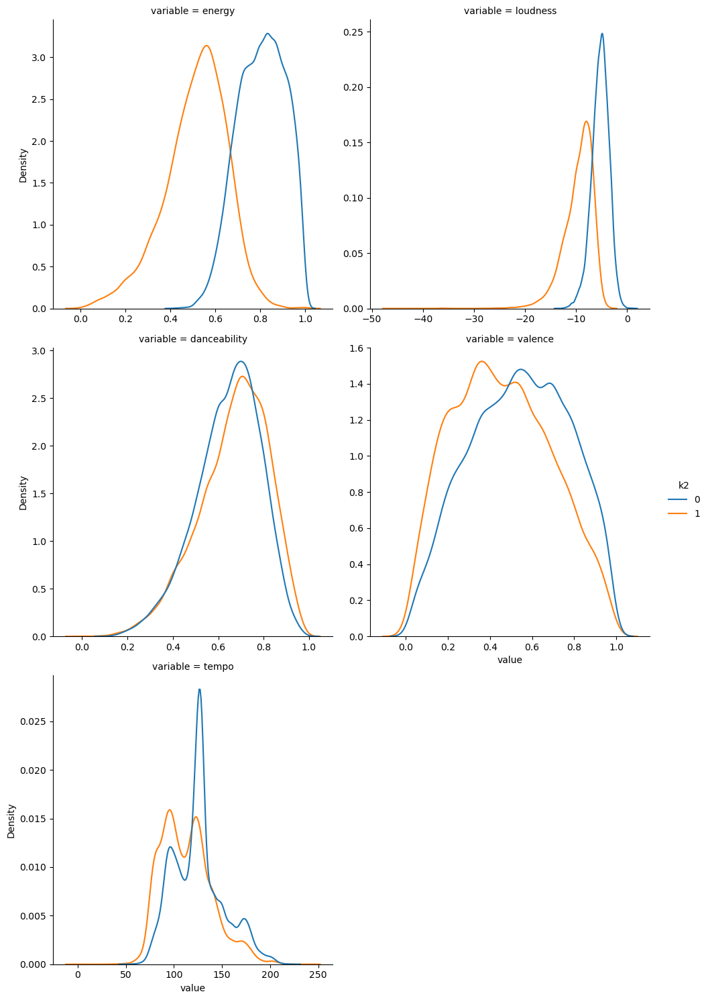

In [134]:
sns.displot(data=df_clean_cluster_copy_lf, x='value', col='variable', hue='k2', kind='kde',
            common_norm=False, col_wrap=2,
            facet_kws={'sharex': False, 'sharey': False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


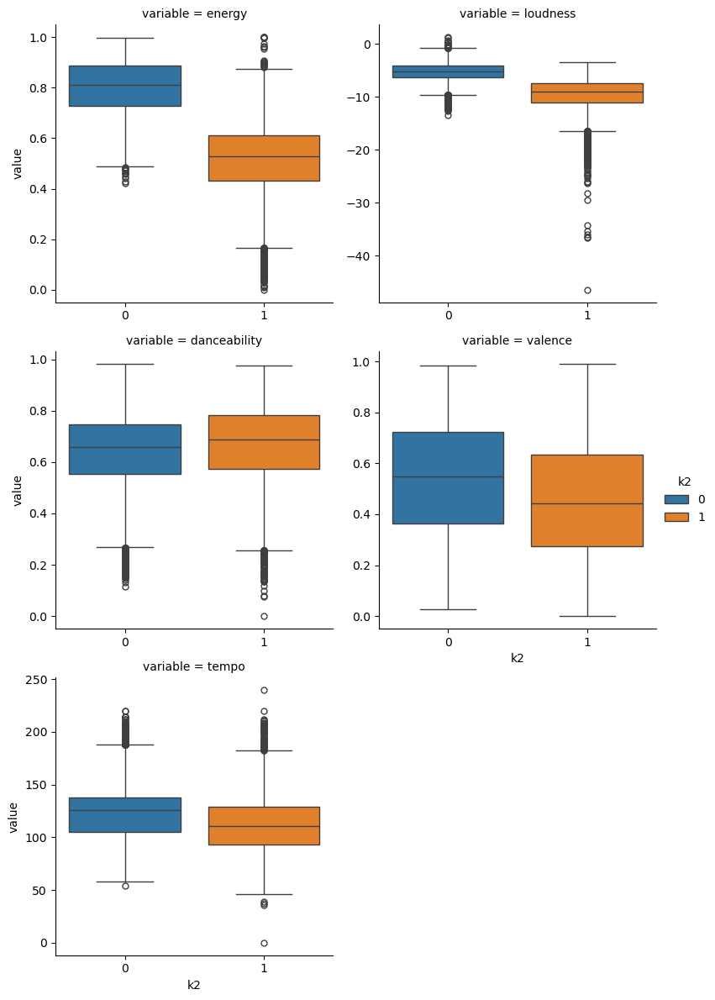

In [135]:
sns.catplot(
    data=df_clean_cluster_copy_lf, x='k2', y='value', col='variable', kind='box',
    col_wrap=2, height=4,
    sharex=False, sharey=False,
    hue='k2'
)

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


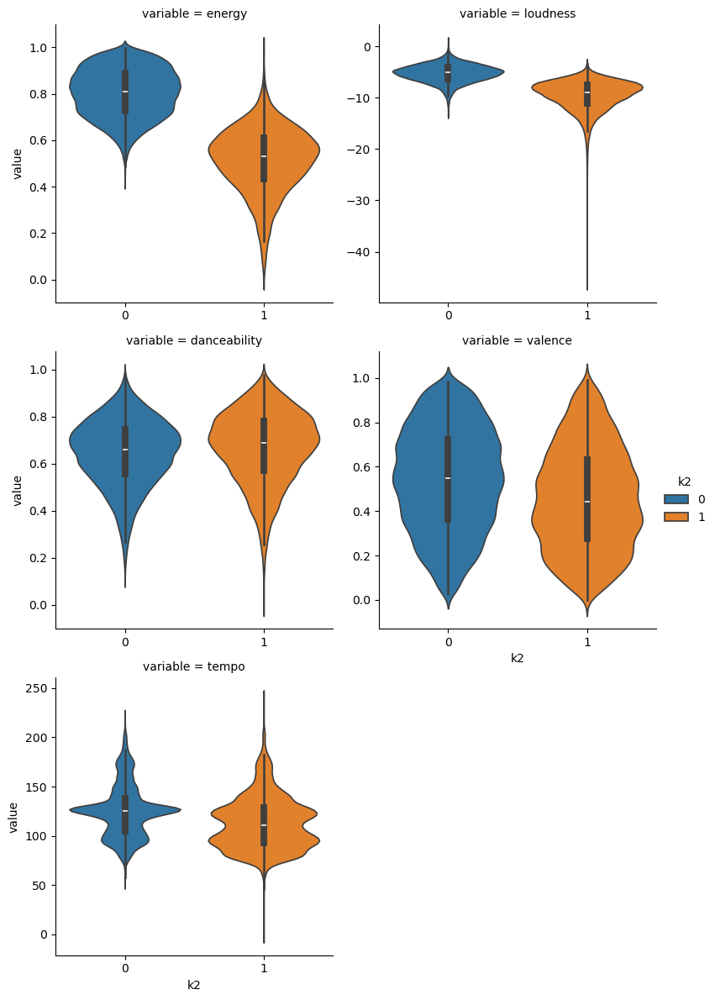

In [136]:
sns.catplot(
    data=df_clean_cluster_copy_lf, x='k2', y='value', col='variable',
    kind='violin', col_wrap=2, height=4,
    sharex=False, sharey=False,
    hue='k2', split=False
)
plt.show()

/var/folders/28/pzyhbg3d5271gzrb2vdpcjrr0000gn/T/ipykernel_11225/508128249.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data = df_clean_cluster_copy_lf, x='k2', y='value', col='variable', kind='point', hue='k2',
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


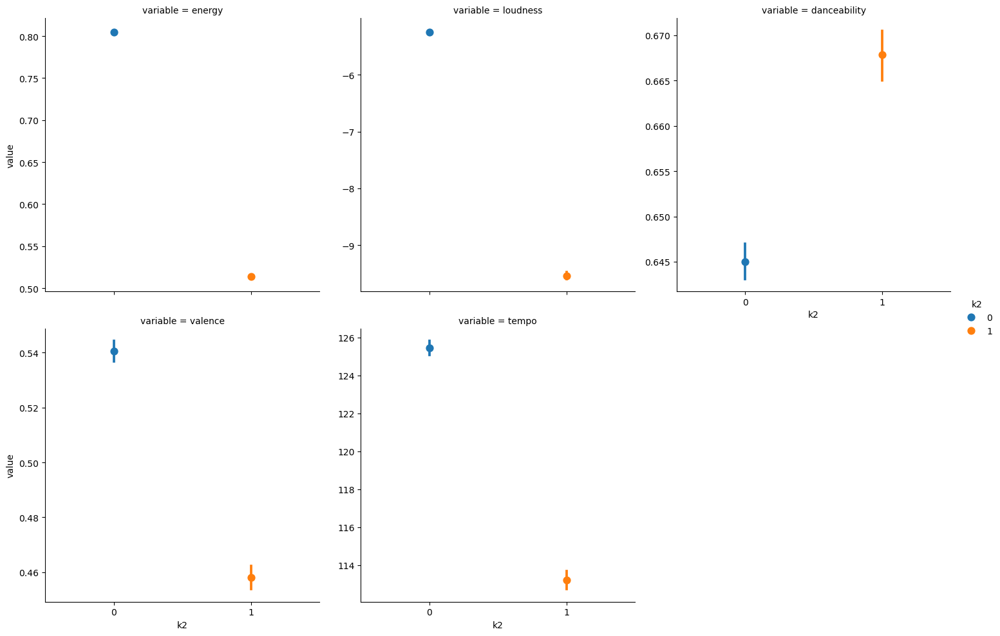

In [137]:
sns.catplot(data = df_clean_cluster_copy_lf, x='k2', y='value', col='variable', kind='point', hue='k2',
            col_wrap=3, sharey=False, join=False,)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


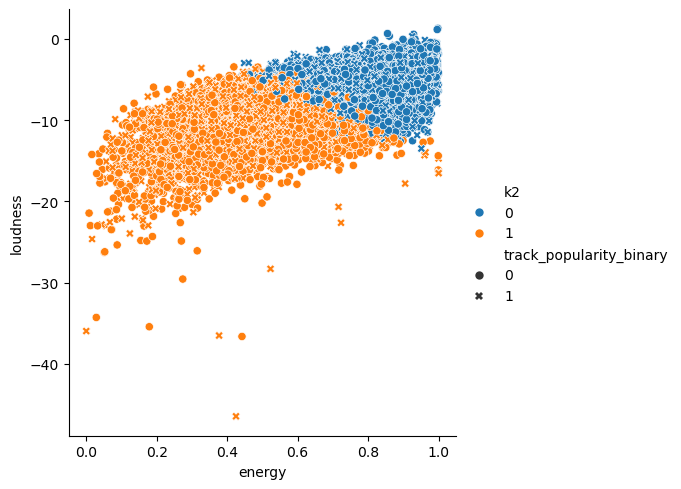

In [138]:
sns.relplot(data = df_clean_cluster_copy, x = 'energy', y = 'loudness', hue = 'k2' , style = 'track_popularity_binary')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


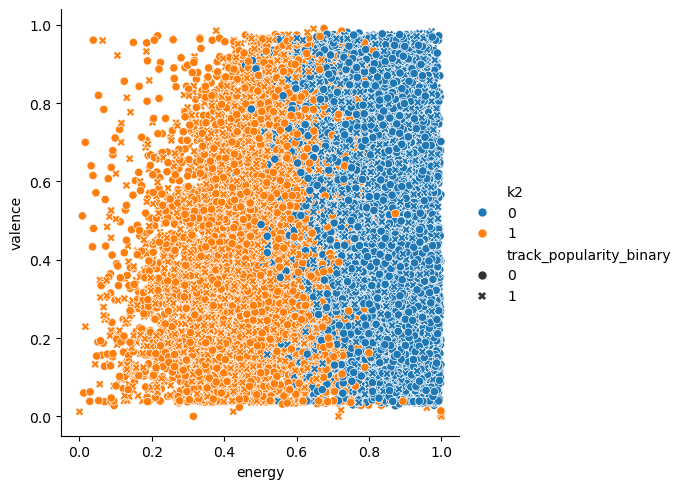

In [139]:
sns.relplot(data = df_clean_cluster_copy, x = 'energy', y = 'valence', hue = 'k2' , style = 'track_popularity_binary')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


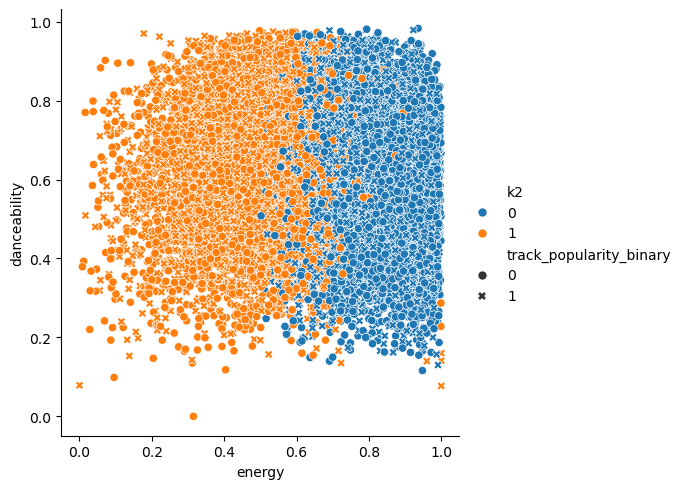

In [140]:
sns.relplot(data = df_clean_cluster_copy, x = 'energy', y = 'danceability', hue = 'k2' , style = 'track_popularity_binary')

plt.show()

### Sources:

#### Stack Overflow link for the groupby:

https://stackoverflow.com/questions/36508487/group-by-with-mode-as-aggregator

https://stackoverflow.com/questions/15222754/groupby-pandas-dataframe-and-select-most-common-value

#### Stack Overflow link for the `track_album_release_date` variables:

https://stackoverflow.com/questions/60699247/editing-the-date-in-pandas-to-show-year-only-by-column#:~:text=You%20can%20convert%20the%20numpy,month%20or%20day%20from%20it.&text=Convert%20this%20date%20to%20pandas,to_datetime%20.

